In [ ]:
pip install bibtexparser textblob wordcloud preprocessor spacy tensorflow pyarrow --quiet

In [1]:
# Load packages
from nltk.corpus import stopwords
from textblob import TextBlob
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import itertools
import collections
from nltk import nltk
import datetime
import time
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import string
import preprocessor as p
import os
import time
import json
import numpy as np
from scipy import stats
from tqdm import tqdm
import plotly.graph_objects as go
import plotly.express as px
import numpy as np
import pyarrow
import re

# Load Article Data

In [2]:
# Read BibTex of Vietnam articles
import bibtexparser

with open("data/vietnam_and_no_war_abstract.bib", encoding = 'utf-8') as bibtex_file:
    bib_database = bibtexparser.load(bibtex_file)
    
vn = pd.DataFrame(bib_database.entries)
vn.head()

,year,url,volume,title,pages,number,keywords,journal,issn,author,abstract,ENTRYTYPE,ID,publisher,isbn,edition
0,2022,http://ezproxy.babson.edu/login?url=https://se...,100,International collaboration to improve physiot...,733 - 738,11,"INTERNATIONAL relations, PROFESSIONAL employee...",Bulletin of the World Health Organization,00429686,"Demey, Didier and Dieye, Sidy O. A. and Feip...",Problem Like most low- and middle-income count...,article,16001622820221101,NaN,NaN,NaN
1,2022,http://ezproxy.babson.edu/login?url=https://se...,100,Hypertension care in demographic surveillance ...,601 - 609,10,"HYPERTENSION epidemiology, PUBLIC health surve...",Bulletin of the World Health Organization,00429686,"Geldsetzer, Pascal and Min Min Tan and Dewi,...",Objective To determine the proportion of adult...,article,15951277420221001,NaN,NaN,NaN
2,2022,http://ezproxy.babson.edu/login?url=https://se...,26,Attributional Accuracy and Leadership Effectiv...,215 - 230,4,"LEADERSHIP, CULTURAL prejudices, PHILOSOPHY of...",Management international / International Manag...,12061697,"C., Lakshman and Linh-Chi Vo and Gok, Kubilay",The literature on the cultural desirability of...,article,16059281620221001,NaN,NaN,NaN
3,2022,http://ezproxy.babson.edu/login?url=https://se...,34,Is There an Informal Employment Penalty in Foo...,2923 - 2947,6,"EMPLOYMENT, STANDARD of living, REGRESSION ana...",European Journal of Development Research,09578811,"Vu, Loan and Rammohan, Anu","In this paper, we investigate the association ...",article,16032631420221201,NaN,NaN,NaN
4,2022,http://ezproxy.babson.edu/login?url=https://se...,NaN,"Disrupting ‘a man's world’: gender, technology...",1,NaN,NaN,Journal of the Royal Anthropological Institute,13590987,"Rydstrom, Helle",Only rarely is Vietnam's global heavy industry...,article,16083583120221219,NaN,NaN,NaN


In [3]:
print(len(vn))
vn['ENTRYTYPE'].value_counts()

24997


article          24703
misc               274
inproceedings       18
inbook               2
Name: ENTRYTYPE, dtype: int64

In [4]:
vn[vn['ENTRYTYPE'] != 'article']['keywords'].value_counts()

Series([], Name: keywords, dtype: int64)

In [78]:
vn['keywords'].replace('no terms assigned',np.NaN, inplace = True)
test = vn[vn['keywords'].isna()]
test.to_csv('vn_test_set_unlabelled.csv', index = False)

In [80]:
vn = vn[vn['keywords'].notna()].reset_index(drop = True)
vn

,year,url,volume,title,pages,number,keywords,journal,issn,author,abstract,ENTRYTYPE,ID,publisher,isbn,edition,topics,lower_title
0,2008,http://ezproxy.babson.edu/login?url=https://se...,None,Economic Internal Rate of Return (EIRR)Estimat...,1 - 6,None,"economic forecasting, power resources, financi...",AACE International Transactions,15287106,"Li Kai and Tiong, Robert",Renewable energy development has experienced r...,article,3372000820080601,None,None,None,"[power resources, financial performance, hydro...",economic internal rate of return (eirr)estimat...
1,2014,http://ezproxy.babson.edu/login?url=https://se...,12,"Health Care is a Right, Not a Privilege. (cove...",282 - 282,1/2,"veterans -- services for, photographs",AAPI Nexus,15450317,"Uyematsu Kao, Mary","A photographs is presented of Nick Nagatani, a...",article,10213313920140901,None,None,None,"[veterans -- services for, photographs]","health care is a right, not a privilege. (cove..."
2,2020,http://ezproxy.babson.edu/login?url=https://se...,110,"CONTRACEPTION, ABORTION, AND FERTILITY RATES: ...",220 - 225,None,"human fertility, draft (military service), rec...",AEA Papers & Proceedings,25740768,"BAILEY, MARTHA J. and CHYN, ERIC",The article provides a time-series evidence of...,article,14325655820200501,None,None,None,"[human fertility, draft (military service), re...","contraception, abortion, and fertility rates: ..."
3,2017,http://ezproxy.babson.edu/login?url=https://se...,73,A method to estimate the path gains and propag...,129 - 138,None,"underwater acoustics, phase shift keying, mult...",AEU: International Journal of Electronics & Co...,14348411,"Nguyen, Van Duc and Luong, Ngoc Son and Pätz...",We propose a method for the estimation of the ...,article,12124390020170301,None,None,None,"[underwater acoustics, phase shift keying, mul...",a method to estimate the path gains and propag...
4,2016,http://ezproxy.babson.edu/login?url=https://se...,29,Analysing the effects of water quality on the ...,665 - 685,6,"water quality, fresh water, invertebrates, wat...",AI Communications,09217126,"Eurie Forio, Marie Anne and Van Echelpoel, Wo...",Macroinvertebrates are globally used in enviro...,article,11996135120161101,None,None,None,"[water quality, fresh water, invertebrates, wa...",analysing the effects of water quality on the ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22481,2021,http://ezproxy.babson.edu/login?url=https://se...,25,Реализация опыта цифровых автоматизированных с...,611 - 622,5,"digital control systems, short circuits, elect...",iPolytech Journal,27824004,"Бажин, Владимир Юрьеви& and Горленков, Денис ...",The work aims to develop digital control and m...,article,15350804020210901,None,None,None,"[digital control systems, short circuits, elec...",реализация опыта цифровых автоматизированных с...
22482,2019/10/01/,https://doi.org/10.1353/pla.2019.0038,19,Doing Research: An Emerging Task of Academic L...,615 - 634,4,foreign countries; academic libraries; researc...,portal: Libraries and the Academy,1531-2542,"Kha, Sanya Minh and Mai, Truong Thi Ngoc",As Vietnamese universities have gradually shif...,article,EJ123305220191001,None,None,None,"[foreign countries, academic libraries, librar...",doing research: an emerging task of academic l...
22483,2021/07/01/,https://doi.org/10.1353/pla.2021.0030,21,The Work Motivation of Academic Librarians in ...,553 - 572,3,motivation; academic libraries; librarians; fo...,portal: Libraries and the Academy,1531-2542,"Kha, Sanya Minh and Hoa, Nguyen Dinh and Han...",Academic library managers need to understand t...,article,EJ130679420210701,None,None,None,"[motivation, academic libraries, librarians, f...",the work motivation of academic librarians in ...
22484,1985,http://ezproxy.babson.edu/login?url=https://se...,8,A behavioral formulation of posttraumatic stre...,9 - 12,1,"behavioral formulation model, posttraumatic st...",the Behavior Therapist,0278-8403,"Keane, Terence M. and Zimering, 

In [ ]:
# Convert year from string to year object
vn['year'] = vn['year'].str[:4]
vn['year'] = pd.to_datetime(vn['year'], format='%Y')
vn['year'].min()

In [81]:
vn.sort_values(by = ['journal','year'], inplace = True )
vn

C:\Users\Nam Nguyen\AppData\Local\Temp\ipykernel_5904\4124456679.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vn.sort_values(by = ['journal','year'], inplace = True )


,year,url,volume,title,pages,number,keywords,journal,issn,author,abstract,ENTRYTYPE,ID,publisher,isbn,edition,topics,lower_title
0,2008,http://ezproxy.babson.edu/login?url=https://se...,None,Economic Internal Rate of Return (EIRR)Estimat...,1 - 6,None,"economic forecasting, power resources, financi...",AACE International Transactions,15287106,"Li Kai and Tiong, Robert",Renewable energy development has experienced r...,article,3372000820080601,None,None,None,"[power resources, financial performance, hydro...",economic internal rate of return (eirr)estimat...
1,2014,http://ezproxy.babson.edu/login?url=https://se...,12,"Health Care is a Right, Not a Privilege. (cove...",282 - 282,1/2,"veterans -- services for, photographs",AAPI Nexus,15450317,"Uyematsu Kao, Mary","A photographs is presented of Nick Nagatani, a...",article,10213313920140901,None,None,None,"[veterans -- services for, photographs]","health care is a right, not a privilege. (cove..."
2,2020,http://ezproxy.babson.edu/login?url=https://se...,110,"CONTRACEPTION, ABORTION, AND FERTILITY RATES: ...",220 - 225,None,"human fertility, draft (military service), rec...",AEA Papers & Proceedings,25740768,"BAILEY, MARTHA J. and CHYN, ERIC",The article provides a time-series evidence of...,article,14325655820200501,None,None,None,"[human fertility, draft (military service), re...","contraception, abortion, and fertility rates: ..."
3,2017,http://ezproxy.babson.edu/login?url=https://se...,73,A method to estimate the path gains and propag...,129 - 138,None,"underwater acoustics, phase shift keying, mult...",AEU: International Journal of Electronics & Co...,14348411,"Nguyen, Van Duc and Luong, Ngoc Son and Pätz...",We propose a method for the estimation of the ...,article,12124390020170301,None,None,None,"[underwater acoustics, phase shift keying, mul...",a method to estimate the path gains and propag...
4,2016,http://ezproxy.babson.edu/login?url=https://se...,29,Analysing the effects of water quality on the ...,665 - 685,6,"water quality, fresh water, invertebrates, wat...",AI Communications,09217126,"Eurie Forio, Marie Anne and Van Echelpoel, Wo...",Macroinvertebrates are globally used in enviro...,article,11996135120161101,None,None,None,"[water quality, fresh water, invertebrates, wa...",analysing the effects of water quality on the ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22481,2021,http://ezproxy.babson.edu/login?url=https://se...,25,Реализация опыта цифровых автоматизированных с...,611 - 622,5,"digital control systems, short circuits, elect...",iPolytech Journal,27824004,"Бажин, Владимир Юрьеви& and Горленков, Денис ...",The work aims to develop digital control and m...,article,15350804020210901,None,None,None,"[digital control systems, short circuits, elec...",реализация опыта цифровых автоматизированных с...
22482,2019/10/01/,https://doi.org/10.1353/pla.2019.0038,19,Doing Research: An Emerging Task of Academic L...,615 - 634,4,foreign countries; academic libraries; researc...,portal: Libraries and the Academy,1531-2542,"Kha, Sanya Minh and Mai, Truong Thi Ngoc",As Vietnamese universities have gradually shif...,article,EJ123305220191001,None,None,None,"[foreign countries, academic libraries, librar...",doing research: an emerging task of academic l...
22483,2021/07/01/,https://doi.org/10.1353/pla.2021.0030,21,The Work Motivation of Academic Librarians in ...,553 - 572,3,motivation; academic libraries; librarians; fo...,portal: Libraries and the Academy,1531-2542,"Kha, Sanya Minh and Hoa, Nguyen Dinh and Han...",Academic library managers need to understand t...,article,EJ130679420210701,None,None,None,"[motivation, academic libraries, librarians, f...",the work motivation of academic librarians in ...
22484,1985,http://ezproxy.babson.edu/login?url=https://se...,8,A behavioral formulation of posttraumatic stre...,9 - 12,1,"behavioral formulation model, posttraumatic st...",the Behavior Therapist,0278-8403,"Keane, Terence M. and Zimering, 

In [82]:
vn['abstract'][0]

'Renewable energy development has experienced rapidly growth in the world energy market. Apart from wind, bio, solar and geo-thermal energy development, the most traditional hydro power is still the most predominant forms of new developments. This could be because of both the economical and geographical factors. One of such typical countries is Vietnam who has 40 percent electricity generated by hydro power plant. Because of the huge shortage in Vietnam power supply, which is 600 million kwh for 2007 as a result of fast economic growth, Vietnam has also undergo a fast development of hydro power plant. Another driving force is the added incentive from the carbon financing to these developments. However, a key evaluation leading to successful approval of financing is the estimation of Economic Internal Rate of Return (EIRR). Although Asian Development Bank (ADB) has given guidelines in evaluating process, there are still large amount of works have to be carried out in estimating the econ

In [2]:
# Lowering is important for topic modelling, where same words should not be treated due to different cases
def lower_text(data, item_col):
    def lower_except(text):
        try:
            return text.lower()
        except:
            return text
    lower_texts = [lower_except(text) for text in tqdm(data[item_col])]
    return lower_texts # returns a list of lower texts that can be assigned as a dataframe's column

In [9]:
vn['keywords'] = lower_text(vn, 'keywords')
vn.tail()

100%|██████████| 24224/24224 [00:00<00:00, 267607.53it/s]


,year,url,volume,title,pages,number,keywords,journal,issn,author,abstract,ENTRYTYPE,ID,publisher,isbn,edition
6037,2021,http://ezproxy.babson.edu/login?url=https://se...,25,Реализация опыта цифровых автоматизированных с...,611 - 622,5,"digital control systems, short circuits, elect...",iPolytech Journal,27824004,"Бажин, Владимир Юрьеви& and Горленков, Денис ...",The work aims to develop digital control and m...,article,15350804020210901,NaN,NaN,NaN
10051,2019/10/01/,https://doi.org/10.1353/pla.2019.0038,19,Doing Research: An Emerging Task of Academic L...,615 - 634,4,foreign countries; academic libraries; researc...,portal: Libraries and the Academy,1531-2542,"Kha, Sanya Minh and Mai, Truong Thi Ngoc",As Vietnamese universities have gradually shif...,article,EJ123305220191001,NaN,NaN,NaN
5083,2021/07/01/,https://doi.org/10.1353/pla.2021.0030,21,The Work Motivation of Academic Librarians in ...,553 - 572,3,motivation; academic libraries; librarians; fo...,portal: Libraries and the Academy,1531-2542,"Kha, Sanya Minh and Hoa, Nguyen Dinh and Han...",Academic library managers need to understand t...,article,EJ130679420210701,NaN,NaN,NaN
24652,1985,http://ezproxy.babson.edu/login?url=https://se...,8,A behavioral formulation of posttraumatic stre...,9 - 12,1,"behavioral formulation model, posttraumatic st...",the Behavior Therapist,0278-8403,"Keane, Terence M. and Zimering, Rose T. and ...","Defines posttraumatic stress disorder (PSD), w...",article,1985-20292-00119850101,NaN,NaN,NaN
4862,2015,http://ezproxy.babson.edu/login?url=https://se...,20,RESISTANT OR FAVORABLE? CHINESE LEARNERS' BELI...,95 - 110,1,"language & culture, english language education...",Íkala: Revista de Lenguaje y Cultura,01233432,"Gal, Damien Le and Pei I-Chou",English as Foreign Language (EFL) in East Asia...,article,11080414320150101,NaN,NaN,NaN


In [12]:
vn['lower_title'] = lower_text(vn,'title')
vn.drop_duplicates("lower_title", inplace = True)
vn.reset_index(drop = True, inplace = True)
vn

100%|██████████| 24224/24224 [00:00<00:00, 353718.54it/s]


,year,url,volume,title,pages,number,keywords,journal,issn,author,abstract,ENTRYTYPE,ID,publisher,isbn,edition,topics,lower_title
0,2008,http://ezproxy.babson.edu/login?url=https://se...,NaN,Economic Internal Rate of Return (EIRR)Estimat...,1 - 6,NaN,"economic forecasting, power resources, financi...",AACE International Transactions,15287106,"Li Kai and Tiong, Robert",Renewable energy development has experienced r...,article,3372000820080601,NaN,NaN,NaN,"[economic forecasting, power resources, financ...",economic internal rate of return (eirr)estimat...
1,2014,http://ezproxy.babson.edu/login?url=https://se...,12,"Health Care is a Right, Not a Privilege. (cove...",282 - 282,1/2,"veterans -- services for, photographs",AAPI Nexus,15450317,"Uyematsu Kao, Mary","A photographs is presented of Nick Nagatani, a...",article,10213313920140901,NaN,NaN,NaN,"[veterans -- services for, photographs]","health care is a right, not a privilege. (cove..."
2,2020,http://ezproxy.babson.edu/login?url=https://se...,110,"CONTRACEPTION, ABORTION, AND FERTILITY RATES: ...",220 - 225,NaN,"human fertility, draft (military service), rec...",AEA Papers & Proceedings,25740768,"BAILEY, MARTHA J. and CHYN, ERIC",The article provides a time-series evidence of...,article,14325655820200501,NaN,NaN,NaN,"[human fertility, draft (military service), re...","contraception, abortion, and fertility rates: ..."
3,2017,http://ezproxy.babson.edu/login?url=https://se...,73,A method to estimate the path gains and propag...,129 - 138,NaN,"underwater acoustics, phase shift keying, mult...",AEU: International Journal of Electronics & Co...,14348411,"Nguyen, Van Duc and Luong, Ngoc Son and Pätz...",We propose a method for the estimation of the ...,article,12124390020170301,NaN,NaN,NaN,"[underwater acoustics, phase shift keying, mul...",a method to estimate the path gains and propag...
4,2016,http://ezproxy.babson.edu/login?url=https://se...,29,Analysing the effects of water quality on the ...,665 - 685,6,"water quality, fresh water, invertebrates, wat...",AI Communications,09217126,"Eurie Forio, Marie Anne and Van Echelpoel, Wo...",Macroinvertebrates are globally used in enviro...,article,11996135120161101,NaN,NaN,NaN,"[water quality, fresh water, invertebrates, wa...",analysing the effects of water quality on the ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22484,2021,http://ezproxy.babson.edu/login?url=https://se...,25,Реализация опыта цифровых автоматизированных с...,611 - 622,5,"digital control systems, short circuits, elect...",iPolytech Journal,27824004,"Бажин, Владимир Юрьеви& and Горленков, Денис ...",The work aims to develop digital control and m...,article,15350804020210901,NaN,NaN,NaN,"[digital control systems, short circuits, elec...",реализация опыта цифровых автоматизированных с...
22485,2019/10/01/,https://doi.org/10.1353/pla.2019.0038,19,Doing Research: An Emerging Task of Academic L...,615 - 634,4,foreign countries; academic libraries; researc...,portal: Libraries and the Academy,1531-2542,"Kha, Sanya Minh and Mai, Truong Thi Ngoc",As Vietnamese universities have gradually shif...,article,EJ123305220191001,NaN,NaN,NaN,[foreign countries; academic libraries; resear...,doing research: an emerging task of academic l...
22486,2021/07/01/,https://doi.org/10.1353/pla.2021.0030,21,The Work Motivation of Academic Librarians in ...,553 - 572,3,motivation; academic libraries; librarians; fo...,portal: Libraries and the Academy,1531-2542,"Kha, Sanya Minh and Hoa, Nguyen Dinh and Han...",Academic library managers need to understand t...,article,EJ130679420210701,NaN,NaN,NaN,[motivation; academic libraries; librarians; f...,the work motivation of academic librarians in ...
22487,1985,http://ezproxy.babson.edu/login?url=https://se...,8,A behavioral formulation of posttraumatic stre...,9 - 12,1,"behavioral formulation model, posttraumatic st...",the Behavior Therapist,0278-8403,"Keane, Terence M. and Zimering, Rose T. and ...","Defines posttr

In [40]:
def convertStringToTokens(data, string_col):
    data[string_col] = data[string_col].str.replace('; ',', ')
    return [string_to_token_except(string) for string in tqdm(data[string_col])]
def string_to_token_except(string):
    try:
        return string.split(', ')
    except:
        return string

In [85]:
vn['topics'] = convertStringToTokens(vn, string_col = 'keywords', sep = ', ')
print(vn['topics'][0])
print(vn['topics'][16662])

100%|██████████| 22481/22481 [00:02<00:00, 10628.94it/s]

['economic forecasting', 'power resources', 'financial performance', 'hydroelectric power plants', 'electric power production', 'economic development', 'energy development', 'hydrothermal electric power systems', 'asia']
['ocean-atmosphere interaction', 'ocean dynamics', 'mixing height (atmospheric chemistry)', 'mesoscale eddies', 'seas', 'southern oscillation', 'el nino', 'vietnam', 'china', 'enso', 'regional coupled model', 'south china sea']


In [86]:
vn = vn.reset_index(drop = True)
sep = '; '
for i in tqdm(range(len(vn))): 
    token_group = []
    for token in vn.at[i,'topics']:
        token_group.extend(token.split(sep))
    vn.at[i,'topics'] = token_group
print(vn['topics'][1])
print(vn['topics'][20000])

100%|██████████| 22481/22481 [00:00<00:00, 61515.39it/s]

['veterans -- services for', 'photographs']
['belief & doubt', 'religion', 'protestantism', 'christians', 'vietnam']


In [15]:
# Remove generic titles
vn = vn[vn['title'] != 'NEW TITLES.']
vn = vn[vn['title'] !='Reviews.']
vn = vn[vn['title'] != 'Dissertation Abstracts * * The dissertation citations and abstracts contained here are published with permission of ProQuest Information and Learning Company. Further reproduction is prohibited without permission. Copies of dissertations may be obtained by addressing your request to ProQuest Information and Learning Company, P.O. Box 1346, Ann Arbor, MI 48106-1346, USA. Telephone (734)761-7400; E-mail: info@proquest.com; Web Site: http://www.lib.umi.com/dissertations.']
vn = vn[vn['title'] != 'General.']
vn.reset_index(drop = True, inplace = True)
print(len(vn))

22486


In [81]:
# Save processed parquet
vn.to_parquet('data/vietnam_non_war_in_abstract_articles.parquet.gzip', index = False)

In [4]:
vn = pd.read_parquet('data/vietnam_non_war_in_abstract_articles.parquet.gzip')
vn.head(3)

,year,url,volume,title,pages,number,keywords,journal,issn,author,abstract,ENTRYTYPE,ID,publisher,isbn,edition,topics,lower_title
0,2008,http://ezproxy.babson.edu/login?url=https://se...,None,Economic Internal Rate of Return (EIRR)Estimat...,1 - 6,None,"economic forecasting, power resources, financi...",AACE International Transactions,15287106,"Li Kai and Tiong, Robert",Renewable energy development has experienced r...,article,3372000820080601,None,None,None,"[economic forecasting, power resources, financ...",economic internal rate of return (eirr)estimat...
1,2014,http://ezproxy.babson.edu/login?url=https://se...,12,"Health Care is a Right, Not a Privilege. (cove...",282 - 282,1/2,"veterans -- services for, photographs",AAPI Nexus,15450317,"Uyematsu Kao, Mary","A photographs is presented of Nick Nagatani, a...",article,10213313920140901,None,None,None,"[veterans -- services for, photographs]","health care is a right, not a privilege. (cove..."
2,2020,http://ezproxy.babson.edu/login?url=https://se...,110,"CONTRACEPTION, ABORTION, AND FERTILITY RATES: ...",220 - 225,None,"human fertility, draft (military service), rec...",AEA Papers & Proceedings,25740768,"BAILEY, MARTHA J. and CHYN, ERIC",The article provides a time-series evidence of...,article,14325655820200501,None,None,None,"[human fertility, draft (military service), re...","contraception, abortion, and fertility rates: ..."


In [2]:
vn = pd.read_parquet('data/vietnam_non_war_in_abstract_articles_labelled.parquet.gzip')
print(len(vn))

22481


In [ ]:
vn2 = pd.read_parquet('data/vietnam_non_war_in_abstract_articles_labelled.parquet.gzip')

In [4]:
#vn.fillna({'topics':''}, inplace = True)

# Identifying Topics

In [4]:
vn.fillna({'topics':'','journal':''}, inplace = True)
vn['topics']

0        [bioactive compounds, breast, antineoplastic a...
1        [colloidal gold, immunoassay, shrimp diseases,...
2        [natural products, flavonoids, cell growth, an...
3        [streaming video & television, quality of serv...
4        [computer vision, taxonomy, linear dynamical s...
                               ...                        
24416                                                     
24417                                                     
24418                                                     
24419                                                     
24420                                                     
Name: topics, Length: 24421, dtype: object

In [9]:
obvious = {'vietnam', 'vietnamese','vietnamese people', 'viet nam', 'research','research article','research funding','asia','southeast asia',
           "etc.",'вьетнам', '越南', 'practices','book','books','publication','publications','review','reviews','case studies','case study',
          'no terms assigned'}
methods = {'convolutional neural network','convolutional neural networks','evaluation','optimization','survey','interviewing','integers','algorithms','comparative studies','generalization',
           'data mining', 'big data','bayesian analysis','statistical correlation','research methodology','evaluation research','longitudinal method',
           'decision trees','linear statistical models','statistical relations',
               'randomized controlled trials','cohort analysis','machine learning','forecasting',
               'artificial neural networks','artificial neural network','standard deviations', 'support vector machines',
           'artificial intelligence', 'prediction models', 'deep learning',
          'equations','mathematics','algebra','mathematical analysis', 'heat equation',
          'modules (algebra)','particle swarm optimization',
          'descriptive statistics','cross-sectional method','confidence intervals',
           'questionnaires', 'data analysis software', 'interviewing' 'surveys','logistic regression analysis','socioeconomic factors','data analysis','odds ratio','statistical sampling','regression analysis',
           'statistics', 'chi-squared test','multivariate analysis','multiple regression analysis',
          'nonlinear analysis', 'degrees of freedom','monte carlo method','analytical solutions', 'mathematical functions', 'problem solving', 'random variables',
          'descriptive statistical analysis','logistic regression','mathematical models',
          'fuzzy clustering','fuzzy clustering technique','big data','structural equation modeling','data envelopment analysis','natural language processing'}
generic = obvious.union(methods)
def remove_generic(data,colname, generic):
    regex = re.compile(r'\b(' + r'|'.join(generic) + r')\b\s*', re.I)
    for i in tqdm(range(0,len(data))):
        data.at[i,colname] = ([token for token in data[colname][i] if not re.search(regex, token)])
    return data

In [9]:

vn = remove_generic(vn, 'topics')
vn['topics'][0]

100%|██████████| 22481/22481 [00:02<00:00, 8931.35it/s]


['power resources',
 'financial performance',
 'hydroelectric power plants',
 'electric power production',
 'economic development',
 'energy development',
 'hydrothermal electric power systems']

In [4]:
docs = vn['topics'].tolist()

# Gibbs Sampling Dirichlet Mixture Model (GSDMM)

Pretrained model good for short texts, few tokens

In [4]:
import pickle
from numpy.random import multinomial
from numpy import log, exp
from numpy import argmax
import json

class MovieGroupProcess:
    def __init__(self, K=8, alpha=0.1, beta=0.1, n_iters=30):
        '''
        A MovieGroupProcess is a conceptual model introduced by Yin and Wang 2014 to
        describe their Gibbs sampling algorithm for a Dirichlet Mixture Model for the
        clustering short text documents.
        Reference: http://dbgroup.cs.tsinghua.edu.cn/wangjy/papers/KDD14-GSDMM.pdf
        Imagine a professor is leading a film class. At the start of the class, the students
        are randomly assigned to K tables. Before class begins, the students make lists of
        their favorite films. The teacher reads the role n_iters times. When
        a student is called, the student must select a new table satisfying either:
            1) The new table has more students than the current table.
        OR
            2) The new table has students with similar lists of favorite movies.
        :param K: int
            Upper bound on the number of possible clusters. Typically many fewer
        :param alpha: float between 0 and 1
            Alpha controls the probability that a student will join a table that is currently empty
            When alpha is 0, no one will join an empty table.
        :param beta: float between 0 and 1
            Beta controls the student's affinity for other students with similar interests. A low beta means
            that students desire to sit with students of similar interests. A high beta means they are less
            concerned with affinity and are more influenced by the popularity of a table
        :param n_iters:
        '''
        self.K = K
        self.alpha = alpha
        self.beta = beta
        self.n_iters = n_iters

        # slots for computed variables
        self.number_docs = None
        self.vocab_size = None
        self.cluster_doc_count = [0 for _ in range(K)]
        self.cluster_word_count = [0 for _ in range(K)]
        self.cluster_word_distribution = [{} for i in range(K)]

    @staticmethod
    def from_data(K, alpha, beta, D, vocab_size, cluster_doc_count, cluster_word_count, cluster_word_distribution):
        '''
        Reconstitute a MovieGroupProcess from previously fit data
        :param K:
        :param alpha:
        :param beta:
        :param D:
        :param vocab_size:
        :param cluster_doc_count:
        :param cluster_word_count:
        :param cluster_word_distribution:
        :return:
        '''
        mgp = MovieGroupProcess(K, alpha, beta, n_iters=30)
        mgp.number_docs = D
        mgp.vocab_size = vocab_size
        mgp.cluster_doc_count = cluster_doc_count
        mgp.cluster_word_count = cluster_word_count
        mgp.cluster_word_distribution = cluster_word_distribution
        return mgp

    @staticmethod
    def _sample(p):
        '''
        Sample with probability vector p from a multinomial distribution
        :param p: list
            List of probabilities representing probability vector for the multinomial distribution
        :return: int
            index of randomly selected output
        '''
        return [i for i, entry in enumerate(multinomial(1, p)) if entry != 0][0]

    def fit(self, docs, vocab_size):
        '''
        Cluster the input documents
        :param docs: list of list
            list of lists containing the unique token set of each document
        :param V: total vocabulary size for each document
        :return: list of length len(doc)
            cluster label for each document
        '''
        alpha, beta, K, n_iters, V = self.alpha, self.beta, self.K, self.n_iters, vocab_size

        D = len(docs)
        self.number_docs = D
        self.vocab_size = vocab_size

        # unpack to easy var names
        m_z, n_z, n_z_w = self.cluster_doc_count, self.cluster_word_count, self.cluster_word_distribution
        cluster_count = K
        d_z = [None for i in range(len(docs))]

        # initialize the clusters
        for i, doc in enumerate(docs):

            # choose a random  initial cluster for the doc
            z = self._sample([1.0 / K for _ in range(K)])
            d_z[i] = z
            m_z[z] += 1
            n_z[z] += len(doc)

            for word in doc:
                if word not in n_z_w[z]:
                    n_z_w[z][word] = 0
                n_z_w[z][word] += 1

        for _iter in range(n_iters):
            total_transfers = 0

            for i, doc in enumerate(docs):

                # remove the doc from it's current cluster
                z_old = d_z[i]

                m_z[z_old] -= 1
                n_z[z_old] -= len(doc)

                for word in doc:
                    n_z_w[z_old][word] -= 1

                    # compact dictionary to save space
                    if n_z_w[z_old][word] == 0:
                        del n_z_w[z_old][word]

                # draw sample from distribution to find new cluster
                p = self.score(doc)
                z_new = self._sample(p)

                # transfer doc to the new cluster
                if z_new != z_old:
                    total_transfers += 1

                d_z[i] = z_new
                m_z[z_new] += 1
                n_z[z_new] += len(doc)

                for word in doc:
                    if word not in n_z_w[z_new]:
                        n_z_w[z_new][word] = 0
                    n_z_w[z_new][word] += 1

            cluster_count_new = sum([1 for v in m_z if v > 0])
            print("In stage %d: transferred %d clusters with %d clusters populated" % (
            _iter, total_transfers, cluster_count_new))
            if total_transfers == 0 and cluster_count_new == cluster_count and _iter>25:
                print("Converged.  Breaking out.")
                break
            cluster_count = cluster_count_new
        self.cluster_word_distribution = n_z_w
        return d_z

    def score(self, doc):
        '''
        Score a document
        Implements formula (3) of Yin and Wang 2014.
        http://dbgroup.cs.tsinghua.edu.cn/wangjy/papers/KDD14-GSDMM.pdf
        :param doc: list[str]: The doc token stream
        :return: list[float]: A length K probability vector where each component represents
                              the probability of the document appearing in a particular cluster
        '''
        alpha, beta, K, V, D = self.alpha, self.beta, self.K, self.vocab_size, self.number_docs
        m_z, n_z, n_z_w = self.cluster_doc_count, self.cluster_word_count, self.cluster_word_distribution

        p = [0 for _ in range(K)]

        #  We break the formula into the following pieces
        #  p = N1*N2/(D1*D2) = exp(lN1 - lD1 + lN2 - lD2)
        #  lN1 = log(m_z[z] + alpha)
        #  lN2 = log(D - 1 + K*alpha)
        #  lN2 = log(product(n_z_w[w] + beta)) = sum(log(n_z_w[w] + beta))
        #  lD2 = log(product(n_z[d] + V*beta + i -1)) = sum(log(n_z[d] + V*beta + i -1))

        lD1 = log(D - 1 + K * alpha)
        doc_size = len(doc)
        for label in range(K):
            lN1 = log(m_z[label] + alpha)
            lN2 = 0
            lD2 = 0
            for word in doc:
                lN2 += log(n_z_w[label].get(word, 0) + beta)
            for j in range(1, doc_size +1):
                lD2 += log(n_z[label] + V * beta + j - 1)
            p[label] = exp(lN1 - lD1 + lN2 - lD2)

        # normalize the probability vector
        pnorm = sum(p)
        pnorm = pnorm if pnorm>0 else 1
        return [pp/pnorm for pp in p]

    def choose_best_label(self, doc):
        '''
        Choose the highest probability label for the input document
        :param doc: list[str]: The doc token stream
        :return:
        '''
        p = self.score(doc)
        return argmax(p),max(p)

In [22]:
doc_lens = [len(doc) for doc in docs]
import statistics
statistics.mean(doc_lens)

10.574574084782705

In [ ]:
docs = vn['topics'].tolist()

# train STMM model
k = 50
n_iters = 30
a = .1 # lower alpha = fewer table (empty tables get removed more easily), higher alpha more table; default is 0.1
b =  .05 # beta represents how tables are chosen based on similarity instead of popularity. Lower beta more similar clusters. Higher beta more popular clusters
mgp = MovieGroupProcess(K=k, alpha=a, beta=b, n_iters=n_iters)
vocab = set(x for doc in docs for x in doc)
n_terms = len(vocab)
y = mgp.fit(docs, n_terms)
# save model
with open(f'k{k}n{n_iters}a{a}b{b}clusters_new_feb.model', 'wb') as f:
    pickle.dump(mgp, f)
    f.close()

In [5]:
# load in trained model 
# train STMM model
k = 50
n_iters = 30
a = .1 
b =  .05
filehandler = open(f'k{k}n{n_iters}a{a}b{b}clusters_new_feb.model', 'rb')
mgp = pickle.load(filehandler)

In [7]:
# helper functions
def top_words(cluster_word_distribution, top_cluster, values):
    '''prints the top words in each cluster'''
    for cluster in top_cluster:
        sort_dicts =sorted(mgp.cluster_word_distribution[cluster].items(), key=lambda k: k[1], reverse=True)[:values]
        print('Cluster %s : %s'%(cluster,sort_dicts))
        print(' — — — — — — — — —')

def cluster_importance(mgp):
    '''returns a word-topic matrix[phi] where each value represents
    the word importance for that particular cluster;
    phi[i][w] would be the importance of word w in topic i.
    '''
    n_z_w = mgp.cluster_word_distribution
    beta, V, K = mgp.beta, mgp.vocab_size, mgp.K
    phi = [{} for i in range(K)]
    for z in range(K):
        for w in n_z_w[z]:
            phi[z][w] = (n_z_w[z][w]+beta)/(sum(n_z_w[z].values())+V*beta)
    return phi

def topic_allocation(df, docs, mgp, topic_dict, threshold):
    '''allocates all topics to each document in original dataframe,
    adding two columns for cluster number and cluster description'''
    topic_allocations = []
    for doc in tqdm(docs):
        topic_label, score = mgp.choose_best_label(doc)
        if score >= threshold:
            topic_allocations.append(topic_label)
        else:
            topic_allocations.append(-1)
    df['cluster'] = topic_allocations

    df['topic_name'] = df.cluster.apply(lambda x: get_topic_name(x, topic_dict))
    print('Complete. Number of documents with topic allocated: {}'.format(len(df)))

def get_topic_name(doc, topic_dict):
    '''returns the topic name string value from a dictionary of topics'''
    topic_desc = topic_dict[doc]
    return topic_desc

In [10]:
doc_count = np.array(mgp.cluster_doc_count)
phi = np.array(cluster_importance(mgp))[:1]
print('Number of documents per topic :', doc_count)
print('*'*20)
# topics sorted by the number of documents they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('Most important clusters (by number of docs inside):',   
       top_index)
print('*'*20)
# show the top words in term frequency for each cluster 
topic_indices = np.arange(start=0, stop=len(doc_count), step=1)
top_words(mgp.cluster_word_distribution, topic_indices, 25)

Number of documents per topic : [ 438  280  756 1344  323  595  554  774   90  152  100   80   42   63
   51  322   56 1042  463   54  398  272  316  762  440  552  525  179
 1102  438   65  205  987 1330  161  568  188   57 1035  708  632  822
 1489  460  393   49  238   98   89  344]
********************
Most important clusters (by number of docs inside): [42  3 33 28 17 38 32 41  7 23]
********************
Cluster 0 : [('hepatitis b', 39), ('epidemiology', 38), ('hepatitis b virus', 37), ('disease prevalence', 32), ('genetic polymorphisms', 30), ('genotypes', 28), ('seroprevalence', 24), ('zoonoses', 22), ('helicobacter pylori', 22), ('dogs', 22), ('prevalence', 21), ('hepatitis c virus', 21), ('polymerase chain reaction', 20), ('hepatitis c', 18), ('molecular epidemiology', 17), ('cysticercosis', 17), ('liver diseases', 17), ('rotaviruses', 16), ('public health', 15), ('diagnosis', 15), ('genotype', 15), ('enzyme-linked immunosorbent assay', 15), ('nucleotide sequence', 14), ('camb

In [8]:
phi = cluster_importance(mgp) # initialize phi matrix
sorted(phi[42].items(), key=lambda x:x[1], reverse = True)

[('economic development', 0.016755762879226397),
 ('foreign investments', 0.010831148489904322),
 ('international trade', 0.009605366202458375),
 ('china', 0.00824338588307399),
 ('asean', 0.006064217372058973),
 ('1975-', 0.005859920324151315),
 ('international economic relations', 0.00551942524430522),
 ('developing countries', 0.0054513262283360005),
 ('economic reform', 0.005178930164459123),
 ('economics', 0.005178930164459123),
 ('economic policy', 0.005042732132520685),
 ('poverty', 0.004838435084613027),
 ('exports', 0.004634138036705369),
 ('economic growth', 0.00456603902073615),
 ('globalization', 0.0044979400047669305),
 ('united states', 0.004157444924920835),
 ('free trade', 0.004089345908951616),
 ('emerging markets', 0.0036807518131363),
 ('international relations', 0.0036126527971670807),
 ('economic expansion', 0.0036126527971670807),
 ('gross domestic product', 0.003340256733290204),
 ('foreign direct investment', 0.003067860669413327),
 ('indonesia', 0.0029316626374

50it [00:22,  2.27it/s]


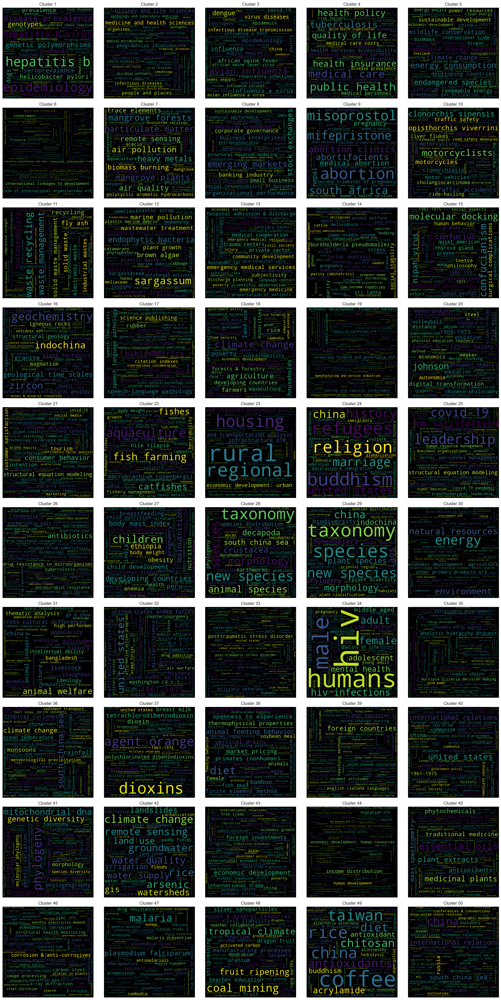

In [40]:
# Create a figure with 10 rows and 5 columns of subplots
fig, axs = plt.subplots(nrows=10, ncols=5, figsize=(25, 50))
plt.subplots_adjust(wspace=0.1, hspace=0.1)

# Iterate over the list of tuples and generate a word cloud for each tuple
for i, data in tqdm(enumerate(phi)):
    # Create a dictionary from the sorted data
    wordcloud_dict = dict(data)
    
    # Create a WordCloud object with transparent background
    wordcloud = WordCloud(width=400, height=400, background_color='rgba(0, 0, 0, 0)').generate_from_frequencies(wordcloud_dict)
    
    # Add the word cloud to the subplot at position (i//5, i%5)
    axs[i//5, i%5].imshow(wordcloud, interpolation='bilinear')
    axs[i//5, i%5].set_title(f"Cluster {i+1}")
    axs[i//5, i%5].axis("off")

# Show the figure
plt.show()


In [33]:
# Do this to print a list of keyword in a cluster
cluster = 11
list(phi[cluster].keys())

['species',
 'polysaccharides',
 'brown algae',
 'sargassum',
 'fucoidan',
 'fish morphology',
 'octopuses',
 'cephalopoda',
 'darknets (file sharing)',
 'territorial waters',
 'amphioctopus ovulum',
 'comparative morphological analyses',
 'distribution',
 'phylogenetic analyses',
 'redescription',
 'natural fibers',
 'fire resistant materials',
 'fireproofing agents',
 'epoxy resins',
 'fibrous composites',
 'endophytic bacteria',
 'plastic scrap',
 'plastic scrap recycling',
 'plastic waste',
 'sargassum mcclurei',
 'sargassaceae',
 'biological activity',
 'rice blast disease',
 'magnaporthe diseases',
 'biological pest control agents',
 'phosphate solubilization',
 'plastic marine debris',
 'plastic recycling',
 'microplastics',
 'catamarans',
 'passenger traffic',
 'antifungal activity',
 'plant growth',
 'black pepper (plant)',
 'black pepper',
 'high-speed passenger catamarans',
 'скоростные пассажирские катамараны',
 'taxonomy',
 'fucales',
 'plastic bags',
 'bacillus (bacteria)

In [33]:
topic_dict = {0:"epidemiology",1:'life & health sciences',2:'pandemics',3:'public health',4:'sustainable development',5:'international economics & business',
              6:'ecosystem',7:'economic development',8:"women's health",9:'traffic management',10:'waste management',
              11:'marine pollution',12:'public health',13:'other',14:'other',15:'geology',
              16:'knowledge economy & technologies',17:'sustainable development',18:'financial markets',19:'other',20:'social & behavioral studies',
              21:'aquaculture',22:'urban development',23:'social history',24:'leadership-management',25:'antibiotics',
              26:"children's health",27:'biodiversity',28:'biodiversity',29:'economic development',30:'other',
              31:'military science',32:'psychological disorders',33:'public health',34:'sustainable development',35:'climatology',
              36:'agent orange',37:'other',38:'education',39:'political science',40:'genetics',
              41:'sustainable development',42:'international economics & business',43:'sociology',44:'phytochemicals',45:'other',
              46:'epidemiology',47:'other',48:'nutrition science',49:'international relations', -1:'other'}
topic_allocation(vn, docs, mgp, topic_dict, 0.9)
vn['topic_name'].value_counts()

100%|██████████| 22481/22481 [00:25<00:00, 877.18it/s] 

Complete. Number of documents with topic allocated: 22481


public health                         2597
sustainable development               2260
international economics & business    1976
biodiversity                          1259
economic development                  1176
other                                 1157
education                             1022
psychological disorders                967
pandemics                              737
social history                         719
epidemiology                           661
political science                      657
genetics                               629
climatology                            556
ecosystem                              544
antibiotics                            540
children's health                      513
financial markets                      446
sociology                              441
leadership-management                  426
phytochemicals                         392
social & behavioral studies            388
international relations                327
geology    

It can be expected that some articles would span several topics (interdisciplinary), so we need a multi-label approach. Another advantage of multi-label strategy is we can design hierarchies or groups.

In [3]:
def manual_assign(data, keyword_set, assignment, method, start_new=True):
    # Create the regular expression pattern outside of the loop
    if method == 'exact':
        pattern = r'\b(?:{})\b'.format('|'.join(map(re.escape, keyword_set)))
    elif method == 'contains':
        pattern = r'(?:{})'.format('|'.join(map(re.escape, keyword_set)))
    regex = re.compile(pattern, re.IGNORECASE)

    # Check if the assignment column exists and create a new column if start_new is True
    if start_new:
        data[assignment] = 0

    # Use vectorized string methods to search for keywords
    mask = data['topics'].str.join(' ').str.contains(regex)

    # Assign values using the boolean mask
    data.loc[mask, assignment] = 1

    return data
### Code optimized by ChatGPT

def fetch_tokens_from_cluster(cluster, keywords):
    regex = re.compile(rf'{keywords}')
    return set([token for token in list(phi[cluster].keys()) if regex.search(token)])

Based on the dominant tokens within each suggested clusters, we create rules. The reason why we don't reapply the model is because it is not reliable, and we want to have some control over which tokens relate to what topic. Again, LDA or GSDMM are merely suggestions. 

In [6]:
keyword_set = {'hepatitis b', 'epidemiology','hepatitis b virus','disease prevalence', 'genetic polymorphisms', 'genotypes', 'seroprevalence', 'zoonoses', 'helicobacter pylori', 'burkholderia pseudomallei',
                'prevalence', 'hepatitis c virus', 'polymerase chain reaction', 'hepatitis c', 'molecular epidemiology', 'cysticercosis', 'liver diseases', 'rotaviruses', 'virus','malaria',
                'genotype', 'disease prevalence','enzyme-linked immunosorbent assay', 'nucleotide sequence', 'malaria', 'infectious diseases', 'hiv',"hiv/aids", 'hpv', 'aids', 'bacterial diseases', 'tropical diseases','viral diseases','infectious disease transmission'}
assignment = "epidemiology"
manual_assign(vn, keyword_set, assignment, method = 'contains')
print(vn[assignment].value_counts())

keyword_set = {'biology and life sciences','medicine and health sciences', 'organisms','organism', 'infectious diseases', 'microbiology', 'pathology and laboratory medicine', 'medical microbiology',
              'microbial pathogens', 'pathogens', 'bacterial diseases', 'tropical diseases', 'viral diseases','diagnostic medicine', 'virus', 'viruses', 'eukaryota', 
              'population biology', 'cancer', 'oncology','burkholderia pseudomallei','antibiotics','drug resistance','polymerase chain reaction','meningitis','iatrogenesis' }
assignment = "life & health sciences"
manual_assign(vn, keyword_set, assignment, method = 'contains')
print(vn[assignment].value_counts())

keyword_set = {'public health','public and occupational health','health care', 'healthcare','public health', 'vaccination','hospital', 'hospitals', 'mhealth', 'hiv', 
               'world health organization', 'aids', "hiv/aids",'health policy', 'health insurance','health services accessibility', 'medical personnel', 'medical care costs',
               'disease prevalence','hypertension', 'mortality','rural conditions','primary health care','medical service','emergency medical services','iatrogenesis'} 
assignment = "public health"
manual_assign(vn, keyword_set, assignment, method='contains')
print(vn[assignment].value_counts())

keyword_set = {'avian influenza','dengue', 'influenza', 'influenza a virus', 'viral diseases', 'african swine fever', 'covid', 'covid-19', 'infectious disease transmission','influenza a h5n1','malaria',
               'vaccination', 'epidemics', 'pandemics', 'respiratory infections', 'african swine fever virus','avian influenza a virus', 'influenza viruses', 'aedes aegypti', 'viruses','virus'}
assignment = "epidemics-pandemics"
manual_assign(vn, keyword_set, assignment, method = 'contains')
print(vn[assignment].value_counts())

keyword_set = {'macroeconomic','international','trade','foreign','world','global','transnational','multinational','financial integration','joint ventures','imf','cross border transactions', 
               'import','export', 'monetary unions', 'wto','european union', 'emigration & immigration'}
assignment = "international economics & business"
manual_assign(vn, keyword_set, assignment, method='contains')
print(vn[assignment].value_counts())

keyword_set = {'forest|лесная|лесное|woods|tiger|national park'}
assignment = "forest & forestry"
manual_assign(vn, keyword_set, assignment, method = 'contains')
print(vn[assignment].value_counts())

keyword_set = {'industrial air|air pollut|air quality|carbon|emission|pahs'}
assignment = "air pollution"
manual_assign(vn, keyword_set, assignment, method = 'contains')
print(vn[assignment].value_counts())

keyword_set = {'pollut'}
assignment = "pollution"
manual_assign(vn, keyword_set, assignment, method = 'contains')
print(vn[assignment].value_counts())

keyword_set = {'fish','schrimp','aquacultur','fleet'}
assignment = "aquaculture & fishery"
manual_assign(vn, keyword_set, assignment, method = 'contains')
print(vn[assignment].value_counts())

keyword_set = {'wildlife','tiger','wild','rhino'}
assignment = "wildlife conservation"
manual_assign(vn, keyword_set, assignment, method = 'contains')
print(vn[assignment].value_counts())

keyword_set = fetch_tokens_from_cluster(6,'soil')
assignment = "soil quality"
manual_assign(vn, keyword_set, assignment, method = 'contains')
print(vn[assignment].value_counts())

assignment = "water management"
manual_assign(vn,{'waste water','wastewater', 'water treatment', 'water', 'water quality'},assignment, method='exact')
print(vn[assignment].value_counts())

keyword_set = {'emerging markets','organizational performance','transition economies','small business','corporate governance','business enterprises','developing countries','social responsibility of business',
               'financial performance','smes','sustainable development','entrepreneurship','supply chain management','firm performance','innovation','corporate social responsibility','technological innovations','capital structure',
               'knowledge management','government ownership','economic development','econom'}
assignment = "economic development"
manual_assign(vn, keyword_set, assignment, method='contains')
print(vn[assignment].value_counts())

keyword_set = {'pregnan','abortion', 'misoprostol','mifepristone','abortifacients',"women's health",'manual vacuum aspiration','woman','women','mammogram','breast milk','breast cancer'}
assignment = "women's health"
manual_assign(vn, keyword_set, assignment, method='contains')
print(vn[assignment].value_counts())

keyword_set = {"traffic|motor|car|mobil|pedestria|road|helmet|transport|taxi|bike"}
assignment = "traffic management"
manual_assign(vn, keyword_set, assignment, method='contains')
print(vn[assignment].value_counts())

manual_assign(vn, {'waste','recycl'}, 'waste management', method='contains')
print(vn['waste management'].value_counts())

manual_assign(vn, {'marine pollut','sea pollut', 'sea water pollut','plastic marine debris'}, 'marine pollution', method='contains')
print(vn['marine pollution'].value_counts())

manual_assign(vn, {'microb','microscop','bateria','bacterium','virus','algae','fungus','fungi','burkholderia pseudomallei','antibiotics','microorganism','escherichia coli',
                   'tuberculosis','salmonella', 'mycobacterium tuberculosis', 'antimicrobial resistance', 'anti-infective agents','drug resistance','polymerase chain'}, 'microbiology', method='contains')
print(vn['microbiology'].value_counts())

manual_assign(vn,{'parasit'},'parasitology', method='contains')
print(vn['parasitology'].value_counts())

manual_assign(vn, {'philosoph','confuci','buddh','christian','jesus','jesuit','mother goddess','relig','ethics'}, 'philosophy-religion', method='contains')
print(vn['philosophy-religion'].value_counts())

manual_assign(vn, {'histor','archaeo','social change','ehnolog','anthropolog','paleo','iron age','stone age'}, 'history', method='contains')
print(vn['history'].value_counts())

manual_assign(vn, {'child','malnutrition'}, "children's health", method='contains')
print(vn["children's health"].value_counts())

manual_assign(vn, {'taxonomy','species','biodiversity','biogeography','morphology'}, "biodiversity", method='contains')
print(vn["biodiversity"].value_counts())

manual_assign(vn, {'essential oil','phytochemi','plant extract'}, "phytochemicals", method='contains')
print(vn["phytochemicals"].value_counts())

manual_assign(vn, {'leader','administrat','personnel management', 'entrepreneurship','organizational performance', 'organizational commitment', 'social responsibility','corporate culture'}, 'leadership-management', method='contains')
print(vn['leadership-management'].value_counts())

assignment='agriculture'
manual_assign(vn, {'rice'}, assignment, method = 'exact')
keyword_set = {'corn','maize','coffee','crop','agricultur','paddy','longan','dragon fruit','fruit','cereal','soy','bean','mango','potato','ripen','banana'}
manual_assign(vn, keyword_set, assignment, method = 'contains', start_new = False)
print(vn[assignment].value_counts())

manual_assign(vn, {'landslide'}, 'landslide', method='contains')
print(vn['landslide'].value_counts())

manual_assign(vn, {'mekong','delta','river','estuar','marshland'}, 'delta', method='contains')
print(vn['delta'].value_counts())

manual_assign(vn, {'mangrove','estuar','marshland','coast'}, 'wetland', method='contains')
print(vn['wetland'].value_counts())

manual_assign(vn, {'climat','storm','monsoon', 'rainfall','cyclone'}, 'climatology', method='contains')
print(vn['climatology'].value_counts())

vn['ecology'] = np.select([(vn['forest & forestry']==1),vn['delta']==1, (vn['wetland']==1)],[1,1,1],default=0)
manual_assign(vn, {'watershed','mountain','highland'}, 'ecology', method='contains', start_new=False)
print(vn['ecology'].value_counts())

manual_assign(vn, {'capital market','money','inflation','financ','wealth management','stock exchange','bank','investment'}, 'financial markets', method='contains')
print(vn['financial markets'].value_counts())

manual_assign(vn, {'corrupt','bribe'}, 'corruption', method='contains')
print(vn['corruption'].value_counts())

manual_assign(vn, {'military','combat','armed force','air force'}, 'military science', method='contains')
print(vn['military science'].value_counts())

manual_assign(vn, {'ptsd','post-tramatic','posttraumatic'}, 'PTSD', method='contains')
print(vn['PTSD'].value_counts())

manual_assign(vn, {'stress','anxiety'}, 'stress & anxiety', method='exact')
print(vn['stress & anxiety'].value_counts())

vn['mental health'] = np.select([(vn['PTSD']==1),(vn['stress & anxiety']==1)], [1,1], default=0)
print(vn['mental health'].value_counts())

manual_assign(vn, {'urban','city'}, 'urban development', method='contains')
print(vn['urban development'].value_counts())

manual_assign(vn, {'rural'}, 'rural development', method='contains')
print(vn['rural development'].value_counts())

manual_assign(vn, {'industr','manufactur','thermal','compression','construction'}, 'industrialization', method='contains')
print(vn['industrialization'].value_counts())

manual_assign(vn, {'renewable', 'solar energy','wind power'}, 'renewable resources', method='contains')
print(vn['renewable resources'].value_counts())

vn['sustainable development'] = np.select([(vn['pollution']==1),vn['renewable resources']==1],[1,1],default=0)
manual_assign(vn, {'sustainab'}, 'sustainable development', method='contains', start_new=False)
print(vn['sustainable development'].value_counts())

manual_assign(vn, {'sea level', 'sediment','watershed','geolog', 'erosion','coast','sand','rare earth'}, 'geology', method='contains')
print(vn['geology'].value_counts())

manual_assign(vn, {'agent orange', 'dioxin'}, 'agent orange', method='contains')
print(vn['agent orange'].value_counts())

manual_assign(vn, {'poverty','poor','impoverished'}, 'poverty reduction', method='contains')
print(vn['poverty reduction'].value_counts())

manual_assign(vn, {'higher education','college','universit','vocational school'}, 'higher education', method='contains')
print(vn['higher education'].value_counts())

manual_assign(vn, {'educat','student','teach','edtech','college','universit','vocational school'}, 'education', method='contains')
print(vn['education'].value_counts())

manual_assign(vn, {'coal mining','steel','petroleum','fuel','diesel','thorium','uranium','rare earth','zinc','alumnium'}, 'mineral resources & mining technologies', method='contains')
print(vn['mineral resources & mining technologies'].value_counts())

manual_assign(vn, {'public-private sector cooperation', 'state-business relations',
 'law reform', 'business & politics', 'decentralisation', 'economic governance',
  'governance and public policy', 'political reform'}, 
  'state-business relations', method='contains')
print(vn['state-business relations'].value_counts())

manual_assign(vn, {'politic','political science','public opinion','public-private sector cooperation', 'state-business relations',
 'law reform', 'business & politics', 'decentralisation', 'economic governance',
  'governance and public policy', 'political reform', 'human right','political participation', 'political parties'}, 
  'political science', method='contains')
print(vn['political science'].value_counts())

manual_assign(vn, {'policy','policies'}, 
  'policies', method='contains')
print(vn['policies'].value_counts())

manual_assign(vn, {'social stability','social unrest','protest','human right'},'social stability', method='contains')
print(vn['social stability'].value_counts())

manual_assign(vn, {'land use','land right','landslide','construction','building'},'land management', method='contains')
print(vn['land management'].value_counts())

keyword_set = {'international','spratly','islands','united states','global','world','diplomacy','diplomat','china-united states relations','maritime law','geopolitic'}
assignment = "international relations"
manual_assign(vn, keyword_set, assignment, method='contains')
print(vn[assignment].value_counts())

keyword_set = {'innovat','industry 4.0','knowledge','digital'}
assignment = "knowledge economy"
manual_assign(vn, keyword_set, assignment, method='contains')
print(vn[assignment].value_counts())

keyword_set = {'trademark','licensing','patent','copyright','intellectual propert'}
assignment = "intellectual properties"
manual_assign(vn, keyword_set, assignment, method='contains')
print(vn[assignment].value_counts())

keyword_set = {'communis','capitalis','ideolog'}
assignment = "ideologies"
manual_assign(vn, keyword_set, assignment, method='contains')
print(vn[assignment].value_counts())

keyword_set = methods
assignment = "applied analytics"
manual_assign(vn, keyword_set, assignment, method = 'exact')
print(vn[assignment].value_counts())

manual_assign(vn,{'culture'},'arts & culture', method='exact')
manual_assign(vn,{'book','artist','media','journalis','litera','poetry'},'arts & culture', method='contains',start_new=False)
print(vn['arts & culture'].value_counts())

manual_assign(vn,{'lingui','language','speech','gramma','consonant','vowel'},'linguistics',method='contains')
print(vn['linguistics'].value_counts())


0    19872
1     2609
Name: epidemiology, dtype: int64
0    20763
1     1718
Name: life & health sciences, dtype: int64
0    19886
1     2595
Name: public health, dtype: int64
0    20841
1     1640
Name: epidemics-pandemics, dtype: int64
0    18423
1     4058
Name: international economics & business, dtype: int64
0    22481
Name: forest & forestry, dtype: int64
0    22481
Name: air pollution, dtype: int64
0    22067
1      414
Name: pollution, dtype: int64
0    21835
1      646
Name: aquaculture & fishery, dtype: int64
0    22273
1      208
Name: wildlife conservation, dtype: int64


NameError: name 'phi' is not defined

In [4]:
manual_assign(vn,{'women','woman'},'women',method='contains')
print(vn['linguistics'].value_counts())

0    21921
1      560
Name: linguistics, dtype: Int64


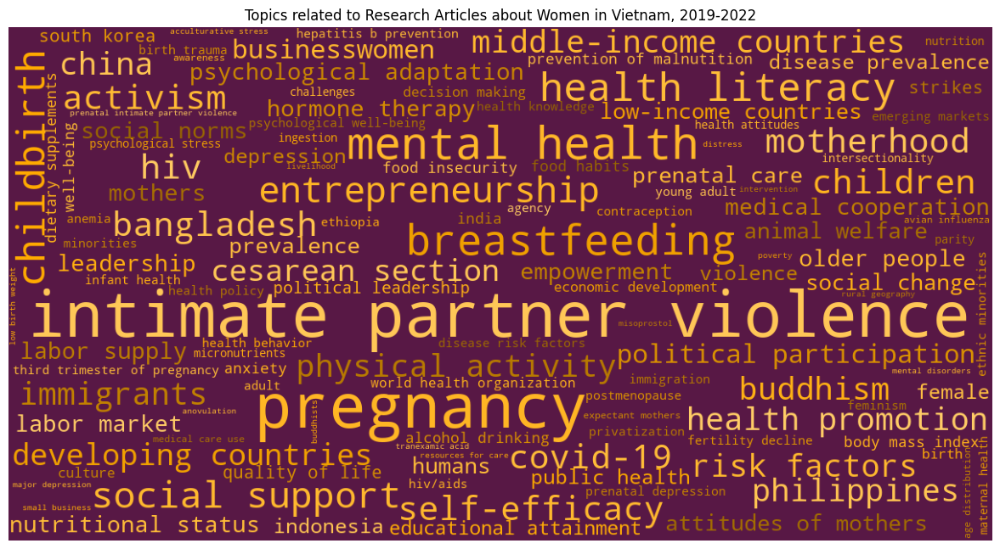

In [46]:
def similar_color_func(word=None, font_size=None,
                       position=None, orientation=None,
                       font_path=None, random_state=None):
    h = 40 # 0 - 360
    s = 100 # 0 - 100
    l = random_state.randint(30, 70) # 0 - 100
    return "hsl({}, {}%, {}%)".format(h, s, l)

all_tokens = []
for tokens in vn[(vn['women']==1) & (vn['year']>=2019)]['topics']:
    all_tokens.extend(tokens)


regex = re.compile(r'\b(' + r'|'.join(generic.union({'woman','women','human females','thematic analysis', 'factor analysis','surveys','gender'})) + r')\b\s*', re.I)
all_tokens = [token for token in all_tokens if not re.search(regex, token)]

# Create WordCloud object
wordcloud = WordCloud(width=1200, height=627, background_color='#581845', stopwords=stopwords, min_font_size=10, color_func=similar_color_func).generate_from_frequencies(dict(pd.Series(all_tokens).value_counts()))

# Plot wordcloud
plt.figure(figsize=(12, 6.27), facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.title("Topics related to Research Articles about Women in Vietnam, 2019-2022")
plt.tight_layout(pad=0)
plt.show()

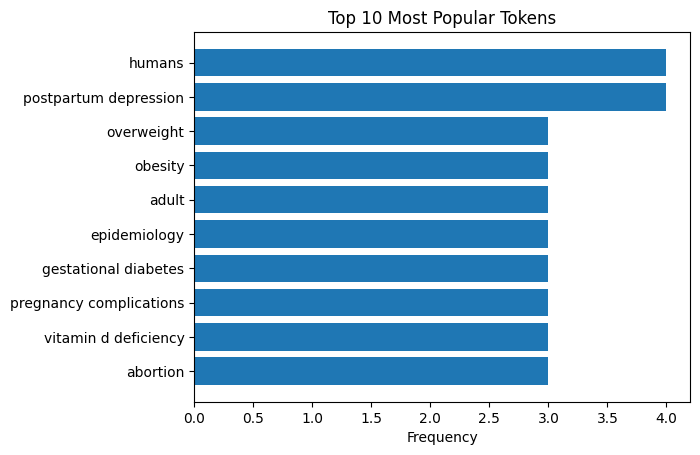

In [26]:
token_counts = Counter(all_tokens)

# Get the top 10 most common tokens
top_tokens = token_counts.most_common(10)

# Extract the tokens and their counts into separate lists
tokens = [token[0] for token in top_tokens]
counts = [token[1] for token in top_tokens]

# Create a horizontal bar chart
plt.barh(tokens, counts)
plt.gca().invert_yaxis()  # Invert y-axis to show most popular tokens at the top
plt.xlabel('Frequency')
plt.title('Top 10 Most Popular Tokens')
plt.show()

In [5]:
preset_topics = ["epidemiology","life & health sciences","public health","epidemics-pandemics","international economics & business","forest & forestry","air pollution",
"pollution","aquaculture & fishery",'parasitology','climatology',"wildlife conservation","soil quality","water management","economic development","women's health", "women","traffic management",'waste management','marine pollution','microbiology','philosophy-religion',
'history',"children's health","biodiversity","phytochemicals",'leadership-management','agriculture','landslide','delta','wetland','ecology','financial markets','corruption','military science','PTSD','stress & anxiety','mental health',
'urban development','rural development','industrialization','renewable resources','sustainable development','geology','agent orange','poverty reduction','higher education','education','mineral resources & mining technologies',
'state-business relations','political science','policies','social stability','land management',"international relations","knowledge economy","intellectual properties","ideologies","applied analytics",
'arts & culture','linguistics']
preset_topics.sort(key=str.lower)


In [6]:
vn.to_parquet('data/vietnam_non_war_in_abstract_articles_labelled.parquet.gzip', index = False)

In [7]:
vn = pd.read_parquet('vietnam_non_war_in_abstract_articles_labelled.parquet.gzip')

# Visualization

In [5]:
pip install dash_bootstrap_components --quiet

Note: you may need to restart the kernel to use updated packages.


In [148]:
vn_gp.head()

,year,agent orange,agriculture,air pollution,applied analytics,aquaculture & fishery,arts & culture,biodiversity,children's health,climatology,...,state-business relations,stress & anxiety,sustainable development,traffic management,urban development,waste management,water management,wetland,wildlife conservation,women's health
0,1975-01-01,0,0,0,2,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
1,1976-01-01,0,0,0,3,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
2,1977-01-01,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,0,0,0
3,1978-01-01,0,1,0,0,0,3,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1979-01-01,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [7]:
import pandas as pd
import numpy as np
from collections import Counter
from tqdm import tqdm
import re

import json
import dash
from jupyter_dash import JupyterDash
from dash import Dash, dcc, html, Input, Output, dash_table

import plotly.express as px
import plotly.graph_objects as go
import dash_bootstrap_components
from datetime import datetime
from collections import OrderedDict

import plotly.io as pio
from itertools import chain

# VN dataset
vn = pd.read_parquet('data/vietnam_non_war_in_abstract_articles_labelled.parquet.gzip',use_nullable_dtypes=True)
def convertStringToTokens(data, string_col):
    data[string_col] = data[string_col].str.replace('; ',', ')
    return [string_to_token_except(string) for string in tqdm(data[string_col])]
def string_to_token_except(string):
    try:
        return string.split(', ')
    except:
        return string

obvious = {'vietnam', 'vietnamese','vietnamese people', 'viet nam', 'research','research article','research funding','asia','southeast asia',
           "etc.",'вьетнам', '越南', 'practices','book','books','publication','publications','review','reviews','case studies','case study',
          'no terms assigned'}
def remove_generic(data, colname, generic):
    regex = re.compile(r'\b(' + r'|'.join(generic) + r')\b\s*', re.I)
    data[colname] = data[colname].apply(lambda tokens: [token for token in tokens if not re.search(regex, token)])
    return data

preset_topics = ["epidemiology","life & health sciences","public health","epidemics-pandemics","international economics & business","forest & forestry","air pollution",
"pollution","aquaculture & fishery",'parasitology','climatology',"wildlife conservation","soil quality","water management","economic development","women","women's health","traffic management",'waste management','marine pollution','microbiology','philosophy-religion',
'history',"children's health","biodiversity","phytochemicals",'leadership-management','agriculture','landslide','delta','wetland','ecology','financial markets','corruption','military science','PTSD','stress & anxiety','mental health',
'urban development','rural development','industrialization','renewable resources','sustainable development','geology','agent orange','poverty reduction','higher education','education','mineral resources & mining technologies',
'state-business relations','political science','policies','social stability','land management',"international relations","knowledge economy","intellectual properties","ideologies","applied analytics",
'arts & culture','linguistics']
preset_topics.sort(key=str.lower)
article_properties = ['title', 'author','year','journal','keywords','url']
year_range = sorted(vn['year'].drop_duplicates(),reverse=True)

vn_long = vn.melt(id_vars=article_properties, value_vars=preset_topics, var_name='topic', value_name='count')
vn_long['tags'] = vn_long['keywords'].apply(string_to_token_except)
vn_long = remove_generic(vn_long, 'tags', obvious)

top_df = vn_long.groupby('topic', as_index=False)[['count']].agg(sum).reset_index(drop=True)
top_topics = top_df.sort_values('count', ascending=False).head(20)['topic'].tolist()

# Special Figures:
## data
gov_edu_exp = pd.read_csv("data/API_SE.XPD.TOTL.GB.ZS_DS2_en_csv_v2_4772085/API_SE.XPD.TOTL.GB.ZS_DS2_en_csv_v2_4772085.csv",
                          usecols=['Country Name'] + list(map(str,range(1975,2021))), dtype={'Country Name': 'string'})
vn_gov_edu_exp = gov_edu_exp[gov_edu_exp['Country Name'] == 'Vietnam'].melt(id_vars=['Country Name'], 
                    value_vars=list(gov_edu_exp.select_dtypes(include=[np.number]).columns), 
                    var_name='year', value_name='edu_exp_pct').dropna().assign(
    pct_change=lambda x: x['edu_exp_pct'].pct_change().fillna(0),
    rel_change=lambda x: x['edu_exp_pct'].transform(lambda x: x / x.iloc[0] - 1),
    year=lambda x: pd.to_datetime(x['year']).dt.year,
    topic="Government expenditure on Education<br>as % of total government expenditure",
    tags=lambda x: x['edu_exp_pct'].apply(lambda y: '{:.2f}% of government expenditure'.format(y)),
    count=lambda x: x['edu_exp_pct'].apply(lambda y: '{:.2f}'.format(y)),
    unit="%"
    )

grp = vn_long.loc[(vn_long['topic'].isin(['education','higher education','knowledge economy'])) & 
                 (vn_long['count']==1)].groupby(['year','topic'], as_index=False)[['count','tags']].agg({'count':sum, 'tags': lambda x:[val for sublist in x if isinstance(sublist, (list, tuple)) for val in sublist]})
grp['tags'] = [dict(Counter(token_list)) for token_list in grp['tags']]
def format_hover(d, k=20):
    d = dict(sorted(d.items(), key=lambda x: x[1], reverse=True)[:k])
    return '<br>'.join(['; '.join([f'{k}: {v}' for k, v in d.items()][i:i+5]) 
                        for i in range(0, len(d), 5)])
grp['tags'] = [format_hover(d) for d in grp['tags']]
grp = grp[grp['year'] >= vn_gov_edu_exp['year'].min()]
grp['pct_change'] = grp.groupby('topic')['count'].pct_change().fillna(0)
grp['rel_change'] = grp.groupby('topic')['count'].transform(lambda x: x / x.iloc[0] - 1)
grp['topic'] = "academic articles on " + grp['topic']
grp['unit'] = ' articles'
grp = pd.concat([grp, vn_gov_edu_exp], ignore_index=True)
grp['count'] = pd.to_numeric(grp['count'])

## Special charts (non-interactive)
def special_figure(fig_data, y_value, yaxis_title, title, legend, hovertemplate, width=900, height=450, font_size=16, title_font=18):
    figure = px.line(fig_data, x='year', y=y_value, color='topic',
            custom_data=['topic','count','unit','tags'],
            hover_data=['tags'],
            color_discrete_sequence=px.colors.qualitative.Dark2,
            width=width, height=height)
    figure.update_traces(hovertemplate=hovertemplate,
                    line={'width':3})
    figure.update_layout(template='plotly_dark',
                         yaxis_title=yaxis_title,
                         font={'size': font_size}, 
                         title={'text':title, 'font': {'size': title_font}},
                         legend=dict(yanchor="top",y=0.99,xanchor="right",x=1))
    figure.add_shape(
    type='line', yref='y', y0=0, y1=0,
    xref='paper', x0=0, x1=1,
    line=dict(color='white', width=1, dash='dash')
    )
    figure.update_layout(legend=legend)
    return figure

title = 'Percentage Change in Number of Articles Related to Education in Vietnam<br>and Government Spending on Education as Percentage of Total Government Expenditure'
hovertemplate='Series: %{customdata[0]}<br>Year: %{x}<br>Percentage Change: %{y:.2%}<br>Current Value: %{customdata[1]}%{customdata[2]}<br>Indicator(s): %{customdata[3]}'
legend = dict(title='Series', yanchor="top", y=0.99, xanchor="right", x=1)
pct_change_figure = special_figure(grp, 'pct_change', 'percentage change', title, legend, hovertemplate)
title = 'Relative Change in Number of Articles Related to Education in Vietnam<br>and Government Spending on Education as % of Total Government Expenditure'
legend = dict(title='Series',yanchor="top",y=0.9,xanchor="left",x=0.1)
hovertemplate='Series: %{customdata[0]}<br>Year: %{x}<br>Relative Change: %{y:.2%}<br>Current Value: %{customdata[1]}%{customdata[2]}<br>Indicator(s): %{customdata[3]}'
rel_change_figure = special_figure(grp[~grp['topic'].isin(['academic articles on higher education', 'academic articles on knowledge economy'])], 'rel_change', 'relative change', title, legend, hovertemplate)

# Default dataset:
## For figure
def add_event(fig, year, event, color='white'):
    fig.add_shape(type='line',
              yref='paper', y0=0, y1=1,
              xref='x', x0=year, x1=year,
              line=dict(color=color, width=1, dash='dash'))
    fig.add_annotation(x=year, y=30, text=event, align='left',
                       showarrow=True,arrowhead=1, ax=0, ay=0.1, arrowcolor='white',arrowwidth=1,
                       font=dict(color=color, size=16), textangle=-90,xshift=-12, yshift=300)
important_events = [(1986, 'Đổi Mới - Economic Reform'),
                    (1991, 'Vietnam joins ASEAN'),
                    (1992, 'The End of Soviet Union'),
                    (1995, 'Normalization of diplomatic relations with the US'),
                    (2000, 'Vietnam-US Bilateral Trade Agreement signed'),
                    (2007, 'Vietnam joins WTO'),
                    (2013, 'East Sea disputes with China intensify'),
                    (2018, 'Cybersecurity Law passed'),
                    (2020, 'COVID-19')]
def main_fig(gp):
    fig = px.line(gp, x='year', y='count', color='topic',
                    custom_data=['topic','tags'],
                    hover_data=['tags'],
                    color_discrete_sequence=px.colors.qualitative.Light24,
                    width=1600, height=900)
    fig.update_traces(hovertemplate='Topic: %{customdata[0]}<br>Year: %{x}<br>Count: %{y}<br>Keywords: %{customdata[1]}',
                        line={'width':2})
    fig.update_layout(template='plotly_dark',yaxis_title='count of articles',
                      font={'size': 18})
    for year, event in important_events:
        add_event(fig, year, event)
    return fig
def format_hover(d, k=30):
    d = dict(sorted(d.items(), key=lambda x: x[1], reverse=True)[:k])
    return '<br>'.join(['; '.join([f'{k}: {v}' for k, v in d.items()][i:i+5]) 
                        for i in range(0, len(d), 5)])

def default_figure():
    df = vn_long.copy()
    df = df[df['topic'].isin(top_topics)]
    df = df[(df['count']==1)]  
    gp = df.groupby(['year','topic'], as_index=False)[['count','tags']].agg({'count':sum, 'tags': lambda x: [val for sublist in x if isinstance(sublist, (list, tuple)) for val in sublist]})
    gp['tags'] = [dict(Counter(token_list)) for token_list in gp['tags']]
    gp['tags'] = [format_hover(d) for d in gp['tags']]
    fig = main_fig(gp)
    return fig

## For table
articles = vn_long[(vn_long['count']==1) & (vn_long['topic'].isin(top_topics))].groupby(article_properties, as_index=False)['topic'].agg({'topic': lambda x: '; '.join(x)})
articles.sort_values('year', ascending=False,inplace=True)

app = JupyterDash(__name__)
app.title = "Landscape of Academic Research on Vietnam"
app.layout = app.layout = html.Div(
    id='app-container',
    children=[
        html.Div(
            id="header-area",
            children=[
                html.H1(
                    id='header-title',
                    children='Landscape of Academic Research on Vietnam',
                ),
                html.P(
                    id="header-description",
                    children=("", html.Br(), ""),
                ),
            ],
        ),
        html.Div(
            id="menu-area",
            children=[
                html.Div(
                    children=[
                        html.H3(
                            className='menu-title',
                            children='Choose Topics'
                        ),
                        dcc.Dropdown(
                            id='topic-filter',
                            className='dropdown',
                            multi=True,
                            options=[{'label': topic, 'value': topic} for topic in preset_topics]
                        )
                    ]
                ),
                html.Div(
                    children=[
                        html.H3(
                            className="menu-title",
                            children="Date Range"
                        ),
                    html.Div(
                        className="row",
                        children=[
                            html.Div(
                                className="row",
                                children=[
                                    html.Div(
                                        className="six columns",
                                        children=[
                                            html.H4(
                                                className='menu-title',
                                                children='From:'
                                            ),
                                            dcc.Dropdown(
                                                id='start-year-dropdown',
                                                options=[{'label':start_year, 'value': start_year} for start_year in year_range],
                                                value=vn['year'].min()
                                            )
                                        ],
                                        style=dict(width='50%', marginRight='10px')
                                    ),
                                    html.Div(
                                        className="six columns",
                                        children=[
                                            html.H4(
                                                className='menu-title',
                                                children='To:'
                                            ),
                                            dcc.Dropdown(
                                                id='end-year-dropdown',
                                                options=[{'label': end_year, 'value': end_year} for end_year in year_range],
                                                value=vn['year'].max()
                                            )
                                        ],
                                        style=dict(width='50%', marginLife='10px')
                                    )
                                ],
                                style=dict(display='flex')
                            )
                        ]
                    ),
                        html.Div(id='output-container')
                    ]
                )
            ]
        ),
        html.Div(
            id="graph-container",
            children=[
                html.Div(style={"marginTop": "20px"}),  # Add a margin to create space
                dcc.Graph(
                id="topic-chart",
                figure=default_figure(),
                config={"displayModeBar": False}
                    )
                ]
            ),
        html.Div(
            id="related-articles-area",
            children=[
                html.H1(
                    id='related-articles-title',
                    children='Related Articles',
                ),
                html.P(
                    id="related-articles-description",
                    children=("", html.Br(), ""),
                ),
                html.Div([
                    dash_table.DataTable(
                        id='datatable-interactivity',
                        columns=[{"name": i, "id": i, "deletable": False, "selectable": True} for i in articles.columns],
                        data=articles.to_dict('records'),
                        editable=True,
                        filter_action="native",
                        sort_action="native",
                        sort_mode="multi",
                        column_selectable="single",
                        row_selectable="multi",
                        row_deletable=True,
                        selected_columns=[],
                        selected_rows=[],
                        page_current=0,
                        style_cell={
                            'textAlign': 'left', 
                            'maxWidth': '300px',  # set maximum width of cell
                            'whiteSpace': 'normal',  # wrap text
                        },
                        style_table={
                            'maxHeight': '900px',
                            'maxWidth': '1600px',
                            'overflowX': 'scroll',
                            'overflowY': 'scroll',
                            'width': '100%'
                                    }
                                )
                            ]
                        )
                        ]
                    ),
            html.Div(
            id="special-figure-area",
            children=[
                html.H1(
                    id='special-figure-area',
                    children='Special Figures',
                ),
                html.P(
                    id="related-articles-description",
                    children=("This section features special figures that relate article data to other data.", html.Br(), 
                              "We hope users to get some insights from the stories that these featured figures imply."),
                ),
                html.Div(
                    className="row",
                    children=[
                        html.Div(
                            className="row",
                            children=[
                                html.Div(
                                    className="six columns",
                                    children=[
                                        html.Div(style={"marginTop": "20px","marginRight": "5px"}),  # Add a margin to create space
                                        dcc.Graph(
                                        id="pct-change-figure",
                                        figure=pct_change_figure,
                                        config={"displayModeBar": False},
                                        style={"border": "1px solid white"}
                                            )
                                        ], style={'width':'50%'}
                                    ),

                                html.Div(
                                    className="six columns",
                                    children=[
                                        html.Div(style={"marginTop": "20px","marginLeft": "5px"}),  # Add a margin to create space
                                        dcc.Graph(
                                        id="rel-change-figure",
                                        figure=rel_change_figure,
                                        config={"displayModeBar": False},
                                        style={"border": "1px solid white"}
                                            )
                                        ], style={'width':'50%'}
                                    )                      
                            ],style=dict(display='flex') 
                        )
                    ]       
                )
            ]
        )
    ]
)

@app.callback(
    Output("topic-chart", "figure"),
    Input("topic-filter", "value"),
    Input('start-year-dropdown', 'value'),
    Input('end-year-dropdown', 'value')
)
def update_figure(topic, start_year, end_year):
    df = vn_long.copy()
    df = df.loc[(df['year'] >= start_year) & (df['year'] <= end_year)]
    if bool(topic):
        df=df[df['topic'].isin(topic)]
        if len(topic) <= 3:
            overlap_name = ' AND '.join(topic)
        else:
            overlap_name = 'intersection of all selected topics'    
        lap_df = df[df['topic'].isin(topic)].groupby(article_properties, as_index=False)['count'].prod()
        lap_df['topic'] = overlap_name
        df = pd.concat([df,lap_df],ignore_index=True)
    else:
        df = df[df['topic'].isin(top_topics)]
    df = df[(df['count']==1)]  
    gp = df.groupby(['year','topic'], as_index=False)[['count','tags']].agg({'count':sum, 'tags': lambda x: [val for sublist in x if isinstance(sublist, (list, tuple)) for val in sublist]})
    gp['tags'] = [dict(Counter(token_list)) for token_list in gp['tags']]
    gp['tags'] = [format_hover(d) for d in gp['tags']]

    fig = main_fig(gp)
    return fig

@app.callback(
    Output('datatable-interactivity', 'data'),
    Input("topic-filter", "value"),
    Input('start-year-dropdown', 'value'),
    Input('end-year-dropdown', 'value')
)
def update_table_data(topic, start_year, end_year):
    data = vn_long.copy()
    data = data.loc[(data['year'] >= start_year) & (data['year'] <= end_year)]
    data = data[data['count']==1]
    data.sort_values('year', ascending=False, inplace = True)
    if bool(topic):
        data=data[data['topic'].isin(topic)]
    else:
        data=data[data['topic'].isin(top_topics)]
    articles = data.groupby(article_properties, as_index=False)['topic'].agg({'topic': lambda x: '; '.join(x)})
    articles.sort_values('year', ascending=False,inplace=True)
    return articles.to_dict('records')
if __name__ == "__main__":
    app.run_server(debug=True)

Dash app running on http://127.0.0.1:8050/


In [37]:
import chart_studio
username='your_username'
api_key='your_api_key'
chart_studio.tools.set_credentials_file(username='namofvietnam',
                                        api_key='lJlccOjrktarrK3TwI9i')
import chart_studio.plotly as py
import chart_studio.tools as tls

import plotly.offline as pyo
def main_fig(gp):
    fig = px.line(gp, x='year', y='count', color='topic',
                    custom_data=['topic','tags'],
                    hover_data=['tags'],
                    color_discrete_sequence=px.colors.qualitative.Light24,
                    width=1600, height=900)
    fig.update_traces(hovertemplate='Topic: %{customdata[0]}<br>Year: %{x}<br>Count: %{y}<br>Keywords: %{customdata[1]}',
                        line={'width':2})
    fig.update_layout(template='plotly_dark',yaxis_title='count of articles',
                      font={'size': 18})
    for year, event in important_events:
        add_event(fig, year, event)
    return fig
def format_hover(d, k=30):
    d = dict(sorted(d.items(), key=lambda x: x[1], reverse=True)[:k])
    return '<br>'.join(['; '.join([f'{k}: {v}' for k, v in d.items()][i:i+5]) 
                        for i in range(0, len(d), 5)])
df = vn_long.copy()
df = df[df['topic'].isin(top_topics)]
df = df[(df['count']==1)]  
gp = df.groupby(['year','topic'], as_index=False)[['count','tags']].agg({'count':sum, 'tags': lambda x: [val for sublist in x if isinstance(sublist, (list, tuple)) for val in sublist]})
gp['tags'] = [dict(Counter(token_list)) for token_list in gp['tags']]
gp['tags'] = [format_hover(d) for d in gp['tags']]
fig = main_fig(gp)
fig.show()

pyo.plot(fig, filename='main_fig.html', auto_open=False, config={'responsive': True})


'main_fig.html'

In [ ]:
<iframe src="https://www.namducnguyen.com/wp-content/uploads/2023/02/main_fig.html" frameborder=0"></iframe>

In [1]:
# long VN dataset
vn_long = pd.read_parquet('data/vietnam_non_war_in_abstract_articles_labelled_long.parquet.gzip',use_nullable_dtypes=True)

In [3]:
vn_long['topic']

0            agent orange
1            agent orange
2            agent orange
3            agent orange
4            agent orange
                ...      
1348855    women's health
1348856    women's health
1348857    women's health
1348858    women's health
1348859    women's health
Name: topic, Length: 1348860, dtype: string

In [ ]:
vn_long['topic'].drop_duplicates()

In [2]:
vn_long.to_parquet('data/vietnam_non_war_in_abstract_articles_labelled_long.parquet.gzip', index=False)

In [5]:
vn_long.to_parquet("C:/Users/nnguyen2/Desktop/vn_research_dash/data/vietnam_non_war_in_abstract_articles_labelled_long.parquet.gzip", index=False)

In [4]:
def convertStringToTokens(data, string_col):
    data[string_col] = data[string_col].str.replace('; ',', ')
    return [string_to_token_except(string) for string in tqdm(data[string_col])]
def string_to_token_except(string):
    try:
        return string.split(', ')
    except:
        return string
convertStringToTokens(vn, 'keywords')

100%|██████████| 22481/22481 [00:00<00:00, 434840.64it/s]


[['economic forecasting',
  'power resources',
  'financial performance',
  'hydroelectric power plants',
  'electric power production',
  'economic development',
  'energy development',
  'hydrothermal electric power systems',
  'asia'],
 ['veterans -- services for', 'photographs'],
 ['human fertility',
  'draft (military service)',
  'recruiting & enlistment (armed forces)',
  'paternity',
  'pregnancy',
  'united states'],
 ['underwater acoustics',
  'phase shift keying',
  'multipath channels',
  'pseudonoise sequences (digital communications)',
  'radio frequency modulation',
  'channel estimation',
  'channel impulse response',
  'channel sounder',
  'correlation detector',
  'underwater acoustic channel measurements'],
 ['water quality',
  'fresh water',
  'invertebrates',
  'watersheds',
  'environmental monitoring',
  'ecological models',
  'classification trees',
  'decision trees',
  'ecological assessment',
  'ecological modelling',
  'pollution'],
 ['toxicity testing',
  '

# Relating Research Article Data to Other Data

In [9]:
# Spending on Education as Percentage of Total Government Spending
gov_edu_exp = pd.read_csv("data/API_SE.XPD.TOTL.GB.ZS_DS2_en_csv_v2_4772085/API_SE.XPD.TOTL.GB.ZS_DS2_en_csv_v2_4772085.csv")
print(len(gov_edu_exp['2021'].dropna()))
print(gov_edu_exp['2021'].mean())
print(gov_edu_exp['2021'].median())
print(gov_edu_exp['2021'].std())
print(len(gov_edu_exp['2008'].dropna()))
print(gov_edu_exp['2008'].mean())
print(gov_edu_exp['2008'].median())
print(gov_edu_exp['2008'].std())



132
14.075586165666666
14.32312965
4.480063552918834
168
15.178211984125001
14.4419899
4.454191200037394


In [46]:
# assuming the first column is 'asset' and the next columns are years from 1999 to 2021
start_year = 2008
end_year = 2021
n_years = end_year - start_year + 1
years = [str(year) for year in range(start_year, end_year+1)]

# select data from 2008 to 2021
data = gov_edu_exp.loc[:, ['Country Name']+years].dropna()

# calculate percentage change for each year
pct_change = data[years].pct_change(axis=1)

# calculate annualized percentage change
annualized_returns = pct_change.apply(lambda x: ((1+x).prod())**(1/n_years)-1, axis=1)

# add the new column to the DataFrame
data['annualized percentage change'] = annualized_returns * 100
data.head()

,Country Name,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,annualized percentage change
2,Afghanistan,16.650000,17.309999,17.06756,16.048429,14.62000,14.102800,14.46593,12.509000,13.09100,12.033200,11.696060,11.34377,10.253860,10.88011,-2.993383
3,Africa Western and Central,18.031691,18.175619,17.05757,14.563540,14.33288,14.963605,12.93988,13.121995,12.85488,16.058439,16.114195,14.15939,14.339985,14.93463,-1.337039
4,Angola,7.410000,9.420000,8.68477,8.940000,8.37043,8.826970,6.16284,8.918780,6.55097,6.763780,5.410230,6.04536,6.467230,6.91961,-0.487885
10,Armenia,14.268450,13.451220,12.40051,12.593340,12.36897,11.136760,9.36712,10.656360,10.19720,10.403130,8.988580,10.01000,8.827780,8.27809,-3.814202
15,Azerbaijan,7.763840,9.343930,8.70084,7.219860,5.64367,6.464130,7.23873,7.631100,8.20000,6.970160,7.409120,8.29069,10.502530,11.48322,2.835233


71
-0.7245388273243373
2.1268009630400733
-0.9939003317114392


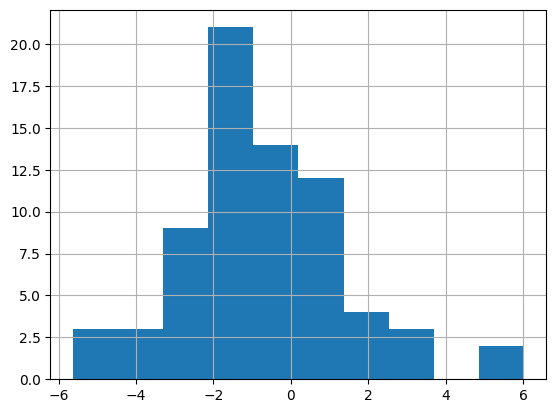

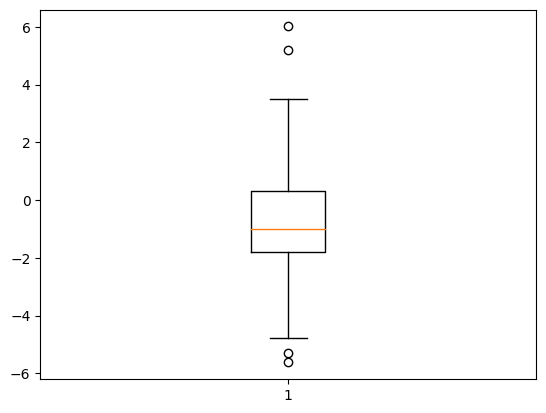

In [70]:
import matplotlib.pyplot as plt
print(len(data['annualized percentage change']))
print(data['annualized percentage change'].mean())
print(data['annualized percentage change'].std())
print(data['annualized percentage change'].median())
data['annualized percentage change'].hist()
fig, ax = plt.subplots()
ax.boxplot(data['annualized percentage change'])
plt.show()

In [86]:
np.percentile(data['annualized percentage change'],[0,33,66,100])

array([-5.6274244 , -1.37701203, -0.01781688,  6.01675291])

In [87]:
data['annualized percentage change'].rank(pct=True)

2      0.140845
3      0.366197
4      0.577465
10     0.084507
15     0.943662
         ...   
241    0.436620
248    0.929577
257    0.338028
263    0.732394
264    0.985915
Name: annualized percentage change, Length: 71, dtype: float64

-5.0066662667781054
30.517166144364158
-11.188717696758747
-17.686282716689632


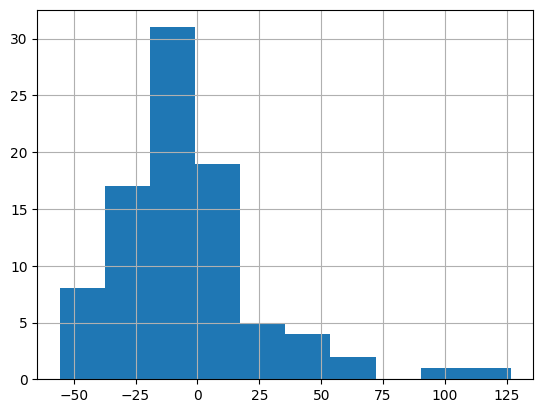

In [64]:
gov_edu_exp['rel_change'] = (gov_edu_exp['2021'] - gov_edu_exp['2008'])/gov_edu_exp['2008']*100
print(gov_edu_exp['rel_change'].mean())
print(gov_edu_exp['rel_change'].std())
print(gov_edu_exp['rel_change'].median())
gov_edu_exp['rel_change'].hist()
print(gov_edu_exp.loc[gov_edu_exp['Country Name'] == 'Vietnam', 'rel_change'].values[0])

In [51]:
from scipy.stats import ttest_1samp
vn_apc = data.loc[data['Country Name'] == 'Vietnam', 'annualized percentage change'].values[0]
t_stat, p_value = ttest_1samp(data['annualized percentage change'], vn_apc)
print('t-statistic: {:.2f}'.format(t_stat))
print('p-value: {:.4f}'.format(p_value))

t-statistic: 2.60
p-value: 0.0114


In [97]:
import scipy.stats
from scipy.stats import percentileofscore
percentile = percentileofscore(data['annualized percentage change'], vn_apc)
print(percentile)
scipy.stats.scoreatpercentile(data['annualized percentage change'], 33)


33.80281690140845


-1.3770120301330335

In [ ]:
scipy.stats.scoreatpercentile()

In [52]:
print(data[data['Country Name']=='Vietnam']['annualized percentage change'])

257   -1.380612
Name: annualized percentage change, dtype: float64


In [57]:
(data['annualized percentage change'].mean() - vn_apc)/data['annualized percentage change'].std()

0.30847909608164226

<AxesSubplot: >

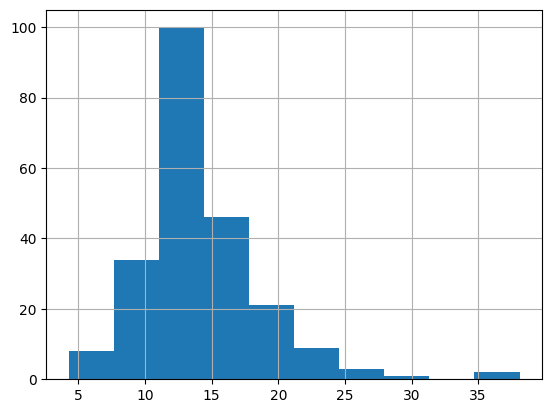

In [11]:
gov_edu_exp['2019'].hist()

In [4]:
gov_edu_exp = pd.read_csv("data/API_SE.XPD.TOTL.GB.ZS_DS2_en_csv_v2_4772085/API_SE.XPD.TOTL.GB.ZS_DS2_en_csv_v2_4772085.csv")
vn_gov_edu_exp = gov_edu_exp[gov_edu_exp['Country Name'] == 'Vietnam'].melt(id_vars=['Country Name'], 
                    value_vars=list(gov_edu_exp.select_dtypes(include=[np.number]).columns), 
                    var_name='year', value_name='edu_exp_pct').dropna().assign(
    pct_change=lambda x: x['edu_exp_pct'].pct_change().fillna(0),
    rel_change=lambda x: x['edu_exp_pct'].transform(lambda x: x / x.iloc[0] - 1),
    year=lambda x: pd.to_datetime(x['year']).dt.year,
    topic="Government expenditure on Education<br>as % of total government expenditure",
    tags=lambda x: x['edu_exp_pct'].apply(lambda y: '{:.2f}% of government expenditure'.format(y)),
    count=lambda x: x['edu_exp_pct'].apply(lambda y: '{:.2f}'.format(y)),
    unit="%"
    )

grp = vn_long.loc[(vn_long['topic'].isin(['education','higher education','knowledge economy'])) & 
                 (vn_long['count']==1)].groupby(['year','topic'], as_index=False)[['count','tags']].agg({'count':sum, 'tags': lambda x:[val for sublist in x if isinstance(sublist, (list, tuple)) for val in sublist]})
grp['tags'] = [dict(Counter(token_list)) for token_list in grp['tags']]
def format_hover(d, k=20):
    d = dict(sorted(d.items(), key=lambda x: x[1], reverse=True)[:k])
    return '<br>'.join(['; '.join([f'{k}: {v}' for k, v in d.items()][i:i+5]) 
                        for i in range(0, len(d), 5)])
grp['tags'] = [format_hover(d) for d in grp['tags']]
grp = grp[grp['year'] >= vn_gov_edu_exp['year'].min()]
grp['pct_change'] = grp.groupby('topic')['count'].pct_change().fillna(0)
grp['rel_change'] = grp.groupby('topic')['count'].transform(lambda x: x / x.iloc[0] - 1)
grp['unit'] = ' articles'
grp = pd.concat([grp, vn_gov_edu_exp], ignore_index=True)
grp['count'] = pd.to_numeric(grp['count'])
grp

,year,topic,count,tags,pct_change,rel_change,unit,Country Name,edu_exp_pct
0,2008,education,54.00,wealth: 15; socialist institutions and their t...,0.000000,0.0,articles,NaN,NaN
1,2008,higher education,3.00,sociodemographic factors: 2; librarians: 1; sc...,0.000000,0.0,articles,NaN,NaN
2,2008,knowledge economy,13.00,attitudes: 6; humans: 5; pregnancy: 5; adult: ...,0.000000,0.0,articles,NaN,NaN
3,2009,education,64.00,income: 23; wealth: 23; socialist institutions...,0.185185,0.185185,articles,NaN,NaN
4,2009,higher education,12.00,higher education: 9; education: 3; foreign cou...,3.000000,3.0,articles,NaN,NaN
5,2009,knowledge economy,7.00,attitudes: 2; male: 2; traditional knowledge: ...,-0.461538,-0.461538,articles,NaN,NaN
6,2010,education,60.00,income distribution: 15; income: 15; economic ...,-0.062500,0.111111,articles,NaN,NaN
7,2010,higher education,14.00,foreign countries: 3; china: 2; universities &...,0.166667,3.666667,articles,NaN,NaN
8,2010,knowledge economy,10.00,health knowledge: 3; parents: 3; energy: 2; co...,0.428571,-0.230769,articles,NaN,NaN
9,2011,education,71.00,foreign countries: 23; wealth: 20; socialist i...,0.183333,0.314815,articles,NaN,NaN


In [27]:
def special_figure(fig_data, y_value, yaxis_title, title, legend, hovertemplate, width=1600, height=900, font_size=26, title_font=30):
    figure = px.line(fig_data, x='year', y=y_value, color='topic',
            custom_data=['topic','count','unit','tags'],
            hover_data=['tags'],
            color_discrete_sequence=px.colors.qualitative.Dark2,
            width=width, height=height)
    figure.update_traces(hovertemplate=hovertemplate,
                    line={'width':5})
    figure.update_layout(template='plotly_dark',
                         yaxis_title=yaxis_title,
                         font={'size': font_size}, 
                         title={'text':title, 'font': {'size': title_font}},
                         legend=dict(yanchor="top",y=0.99,xanchor="right",x=1))
    figure.add_shape(
    type='line', yref='y', y0=0, y1=0,
    xref='paper', x0=0, x1=1,
    line=dict(color='white', width=1, dash='dash')
    )
    figure.update_layout(legend=legend)
    return figure
title = 'Percentage Change in Number of Articles Related to Education in Vietnam<br>and Government Spending on Education as Percentage of Total Government Expenditure'
hovertemplate='Series: %{customdata[0]}<br>Year: %{x}<br>Percentage Change: %{y:.2%}<br>Current Value: %{customdata[1]}%{customdata[2]}<br>Indicator(s): %{customdata[3]}'
legend = dict(title='Series', yanchor="top", y=0.99, xanchor="right", x=1)
pct_change_figure = special_figure(grp, 'pct_change', 'percentage change', title, legend, hovertemplate)
title = 'Relative Change in Number of Articles Related to Education in Vietnam<br>and Government Spending on Education as % of Total Government Expenditure'
legend = dict(title='Series',yanchor="top",y=0.9,xanchor="left",x=0.1)
hovertemplate='Series: %{customdata[0]}<br>Year: %{x}<br>Relative Change: %{y:.2%}<br>Current Value: %{customdata[1]}%{customdata[2]}<br>Indicator(s): %{customdata[3]}'
rel_change_figure = special_figure(grp[~grp['topic'].isin(['academic articles on higher education', 'academic articles on knowledge economy'])], 'rel_change', 'relative change', title, legend, hovertemplate)

pyo.plot(pct_change_figure, filename='pct_change_figure.html', auto_open=False)
pyo.plot(rel_change_figure, filename='rel_change_figure.html', auto_open=False)


'rel_change_figure.html'

In [26]:
pct_change_figure.show()

In [25]:
rel_change_figure.show()

In [1]:
import pandas as pd
import numpy as np
from collections import Counter
from tqdm import tqdm
import json
import dash
from jupyter_dash import JupyterDash
from dash import Dash, dcc, html, Input, Output, dash_table

import plotly.express as px
import plotly.graph_objects as go
import dash_bootstrap_components
from datetime import datetime
from collections import OrderedDict

import plotly.io as pio
from itertools import chain

vn = pd.read_parquet('vietnam_non_war_in_abstract_articles_labelled.parquet.gzip',use_nullable_dtypes=True)
def convertStringToTokens(data, string_col, sep):
    def string_to_token_except(string):
        try:
            return string.split(sep)
        except:
            return string
    token_list = [string_to_token_except(string) for string in tqdm(data[string_col])]
    return token_list

vn['keywords'] = convertStringToTokens(vn, string_col = 'keywords', sep = ', ')

vn = vn.reset_index(drop = True)
sep = '; '
for i in tqdm(range(len(vn))): 
    token_group = []
    for token in vn.at[i,'keywords']:
        token_group.extend(token.split(sep))
    vn.at[i,'keywords'] = token_group

preset_topics = ["epidemiology","life & health sciences","public health","epidemics-pandemics","international economics & business","forest & forestry","air pollution",
"pollution","aquaculture & fishery",'parasitology','climatology',"wildlife conservation","soil quality","water management","economic development","women's health","traffic management",'waste management','marine pollution','microbiology','philosophy-religion',
'history',"children's health","biodiversity","phytochemicals",'leadership-management','agriculture','landslide','delta','wetland','ecology','financial markets','corruption','military science','PTSD','stress & anxiety','mental health',
'urban development','rural development','industrialization','renewable resources','sustainable development','geology','agent orange','poverty reduction','higher education','education','mineral resources & mining technologies',
'state-business relations','political science','policies','social stability','land management',"international relations","knowledge economy","intellectual properties","ideologies","applied analytics",
'arts & culture','linguistics']
preset_topics.sort(key=str.lower)
article_properties = ['title', 'author','year','journal','keywords','url']
year_range = sorted(vn['year'].drop_duplicates(),reverse=True)
vn_long = vn.melt(id_vars=article_properties, value_vars=preset_topics, var_name='topic', value_name='count')

# Default dataset:
## For figure
df=vn_long.copy()
top_df = df.groupby('topic', as_index=False)[['count']].agg(sum).reset_index(drop=True)
top_topics = top_df.sort_values('count', ascending=False).head(20)['topic'].tolist()
df = df[df['topic'].isin(top_topics)]
gp = df.groupby(['year','topic'], as_index=False)[['count','keywords']].agg({'count':sum, 'keywords': lambda x: list(chain.from_iterable(x))})
gp['keywords'] = [dict(Counter(token_list)) for token_list in gp['keywords']]
def format_hover(d, k=20):
    d = dict(sorted(d.items(), key=lambda x: x[1], reverse=True)[:k])
    return '<br>'.join(['; '.join([f'{k}: {v}' for k, v in d.items()][i:i+5]) 
                        for i in range(0, len(d), 5)])
gp['keywords'] = [format_hover(d) for d in gp['keywords']]

fig = px.line(gp, x='year', y='count', color='topic',
                custom_data=['topic','keywords'],
                hover_data=['keywords'],
                width=1600, height=900)
fig.update_traces(hovertemplate='Topic: %{customdata[0]}<br>Year: %{x}<br>Count: %{y}<br>Keywords: %{customdata[1]}')
fig.update_layout(template='plotly_dark',yaxis_title='count of articles')
fig.update_traces()


100%|██████████| 22481/22481 [00:00<00:00, 29486.91it/s]
